**This notebook creates new dataframes with 1 row per MCS (as opposed to the original dataframes that include multiple rows for a single MCS (i.e. 1 per hour of lifetime))**

In [2]:
import iris
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import iris.quickplot as qplt
import iris.plot as iplt
import datetime
import shutil
from pathlib import Path
import trackpy
from iris.time import PartialDateTime
import cartopy.crs as ccrs
import xarray as xr
import netCDF4 as nc
import scipy
from scipy import ndimage
from scipy.ndimage import label, generate_binary_structure
import seaborn as sns

#import packages that output memory usage:
#from sys import getsizeof

import tobac #tobac package cloned from https://github.com/tobac-project/tobac.git

import warnings
warnings.filterwarnings('ignore')

import cftime


In [3]:
## testing on the lpb_tracks_obs dataframe first as it's smallest ##
####################################################################
# time_reference = cftime.Datetime360Day(year=2001, month=1, day=1, hour=0) 
# time_reference

lpb_tracks_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/merged/all_years_combined_CCPF/all_years_CCPF_cpm_hindcast.hdf', 'table')

# all_years_cpm = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/merged/all_years_combined_CCPF/all_years_CCPF_cpm_hindcast.hdf', 'table')
# all_years_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/merged/all_years_combined_CCPF/all_years_CCPF_obs.hdf', 'table')
# all_years_pd = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_PD_TRACKS/final_tracks/merged/all_years_combined_CCPF/all_years_CCPF.hdf', 'table')

lpb_tracks_obs= lpb_tracks_obs[lpb_tracks_obs.datetime.dt.year > 2000]
#lpb_tracks_obs = lpb_tracks_obs[lpb_tracks_obs.time >= time_reference].sort_values(by='timestr', ascending=True)

In [4]:
pd.set_option("display.max_columns", 53)
lpb_tracks_obs.sort_values('timestr', ascending=True)

# Need to remane the columns to latitude and longitude (and -360 from the longitude) for velocity function and plotting to work 
lpb_tracks_obs.rename(columns={'projection_x_coordinate': 'longitude', 'projection_y_coordinate': 'latitude'}, inplace=True)
#all_years_CCPF.rename(columns={'projection_x_coordinate': 'longitude', 'projection_y_coordinate': 'latitude'}, inplace=True)

lpb_tracks_obs.longitude = lpb_tracks_obs.longitude - 360
#all_years_CCPF.longitude = all_years_CCPF.longitude - 360

In [5]:
lpb_tracks_obs

,frame,idx,hdim_1,hdim_2,num,threshold_value,feature,time,timestr,latitude,longitude,cell,time_cell,total_precip,rain_flag,convective_precip,heavy_precip,extreme_precip,heavy_rain_flag,extreme_rain_flag,max_precip,mean_precip_total,mean_precip,tb_min,tb_mean,tb_210,tb_200,tb_190,tb_180,w_max,w_min,w_mean,w_mean_up,w_mean_down,w_up_area,w_down_area,w_0.1_up,w_1_up,w_5_up,w_0.1_down,w_1_down,w_5_down,datetime,max_precip_lat,max_precip_lon,min_tb_lat,min_tb_lon,max_w_up_lat,max_w_up_lon,max_w_down_lat,max_w_down_lon,colocated_pixels
91202,7842,197,739.452334,926.663146,5737,240,91203,2001-11-23 18:30:00,2001-11-23 18:30:00,-10.092231,-47.510101,200119979,0 days 00:00:00,0.000000,0,0.000000,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 18:30:00,0,0,0,0,0,0,0,0,0
91215,7843,180,728.212517,936.743203,7517,240,91216,2001-11-23 19:30:00,2001-11-23 19:30:00,-10.547444,-47.101838,200119979,0 days 01:00:00,1643.805664,181,1594.006714,1035.532715,51.308914,49,1,51.308914,1.336427,8.806667,202.846848,226.697815,71,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 19:30:00,-11.25,-47.25,-11.85,-46.549999,0,0,0,0,50
91227,7844,156,712.907188,957.259544,2695,240,91228,2001-11-23 20:30:00,2001-11-23 20:30:00,-11.167310,-46.270922,200119979,0 days 02:00:00,1215.718506,150,1193.918579,703.774353,64.053886,34,1,64.053886,2.719728,7.959457,201.104294,220.350800,99,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 20:30:00,-11.35,-47.25,-11.25,-47.25,0,0,0,0,65
91244,7845,128,715.153405,961.401157,3035,240,91245,2001-11-23 21:30:00,2001-11-23 21:30:00,-11.076337,-46.103200,200119979,0 days 03:00:00,1043.779297,157,1024.854858,527.244507,0.000000,28,0,43.565571,2.100160,6.527738,202.862335,218.923096,100,0,0,0,3.351245,-0.428561,0.093596,0.202713,-0.096908,316.0,181.0,74.0,18.0,0.0,71.0,0.0,0.0,2001-11-23 21:30:00,-11.45,-47.349998,-11.15,-47.049999,-11.45,-47.349998,-11.65,-46.150002,58
91265,7846,111,712.612037,969.437875,4372,240,91266,2001-11-23 22:30:00,2001-11-23 22:30:00,-11.179263,-45.777708,200119979,0 days 04:00:00,1216.182007,182,1156.728516,567.345947,0.000000,32,0,43.524506,1.684463,6.355651,206.241165,223.072479,48,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 22:30:00,-12.15,-45.650002,-11.95,-45.75,0,0,0,0,41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66806,5797,143,1331.028885,129.840527,9599,240,66807,2007-08-30 13:30:00,2007-08-30 13:30:00,13.866618,-79.781396,200715121,0 days 11:00:00,447.971558,65,417.600952,262.583954,0.000000,14,0,37.119713,0.292983,6.424630,196.335266,218.773407,358,71,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2007-08-30 13:30:00,13.15,-81.050003,14.95,-80.650002,0,0,0,0,29
66814,5798,132,1322.638850,133.542454,9341,240,66815,2007-08-30 14:30:00,2007-08-30 14:30:00,13.526824,-79.631475,200715121,0 days 12:00:00,1046.741943,96,1015.218384,805.243713,165.554642,35,3,57.176388,0.688646,10.575191,196.974564,219.097534,365,55,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2007-08-30 14:30:00,9.25,-81.050003,14.95,-80.650002,0,0,0,0,24
66825,5799,144,1316.733783,132.185515,9368,240,66826,2007-08-30 15:30:00,2007-08-30 15:30:00,13.287669,-79.686426,200715121,0 days 13:00:00,1336.244507,123,1304.748657,967.683899,55.127739,37,1,55.127739,0.875652,10.607713,196.275467,218.880081,395,55,0,0,3.678840,-0.808590,0.016414,0.148188,-0.063625,546.0,878.0,80.0,24.0,0.0,147.0,0.0,0.0,2007-08-30 15:30:00,9.75,-80.949997,11.25,-79.349998,10.95,-80.550003,13.85,-82.550003,46
66836,5800,170,1311.974914,129.992302,9545,240,66837,2007-08-30 16:30:00,2007-08-30 16:30:00,13.094935,-79.775245,200715121,0 days 14:00:00,1179.952881,128,1148.903320,797.498901,0.000000,38,0,42.662777,0.770707,8.975807

In [6]:
# # velocity

# import tobac
# import functions

# #first need to run the tobac calculate velocity function before running my own function to create the histogram
# vel_lpb_obs = tobac.calculate_velocity(lpb_tracks_obs, method_distance=None)

In [7]:
lpb_tracks_obs

,frame,idx,hdim_1,hdim_2,num,threshold_value,feature,time,timestr,latitude,longitude,cell,time_cell,total_precip,rain_flag,convective_precip,heavy_precip,extreme_precip,heavy_rain_flag,extreme_rain_flag,max_precip,mean_precip_total,mean_precip,tb_min,tb_mean,tb_210,tb_200,tb_190,tb_180,w_max,w_min,w_mean,w_mean_up,w_mean_down,w_up_area,w_down_area,w_0.1_up,w_1_up,w_5_up,w_0.1_down,w_1_down,w_5_down,datetime,max_precip_lat,max_precip_lon,min_tb_lat,min_tb_lon,max_w_up_lat,max_w_up_lon,max_w_down_lat,max_w_down_lon,colocated_pixels
91202,7842,197,739.452334,926.663146,5737,240,91203,2001-11-23 18:30:00,2001-11-23 18:30:00,-10.092231,-47.510101,200119979,0 days 00:00:00,0.000000,0,0.000000,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 18:30:00,0,0,0,0,0,0,0,0,0
91215,7843,180,728.212517,936.743203,7517,240,91216,2001-11-23 19:30:00,2001-11-23 19:30:00,-10.547444,-47.101838,200119979,0 days 01:00:00,1643.805664,181,1594.006714,1035.532715,51.308914,49,1,51.308914,1.336427,8.806667,202.846848,226.697815,71,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 19:30:00,-11.25,-47.25,-11.85,-46.549999,0,0,0,0,50
91227,7844,156,712.907188,957.259544,2695,240,91228,2001-11-23 20:30:00,2001-11-23 20:30:00,-11.167310,-46.270922,200119979,0 days 02:00:00,1215.718506,150,1193.918579,703.774353,64.053886,34,1,64.053886,2.719728,7.959457,201.104294,220.350800,99,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 20:30:00,-11.35,-47.25,-11.25,-47.25,0,0,0,0,65
91244,7845,128,715.153405,961.401157,3035,240,91245,2001-11-23 21:30:00,2001-11-23 21:30:00,-11.076337,-46.103200,200119979,0 days 03:00:00,1043.779297,157,1024.854858,527.244507,0.000000,28,0,43.565571,2.100160,6.527738,202.862335,218.923096,100,0,0,0,3.351245,-0.428561,0.093596,0.202713,-0.096908,316.0,181.0,74.0,18.0,0.0,71.0,0.0,0.0,2001-11-23 21:30:00,-11.45,-47.349998,-11.15,-47.049999,-11.45,-47.349998,-11.65,-46.150002,58
91265,7846,111,712.612037,969.437875,4372,240,91266,2001-11-23 22:30:00,2001-11-23 22:30:00,-11.179263,-45.777708,200119979,0 days 04:00:00,1216.182007,182,1156.728516,567.345947,0.000000,32,0,43.524506,1.684463,6.355651,206.241165,223.072479,48,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001-11-23 22:30:00,-12.15,-45.650002,-11.95,-45.75,0,0,0,0,41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66806,5797,143,1331.028885,129.840527,9599,240,66807,2007-08-30 13:30:00,2007-08-30 13:30:00,13.866618,-79.781396,200715121,0 days 11:00:00,447.971558,65,417.600952,262.583954,0.000000,14,0,37.119713,0.292983,6.424630,196.335266,218.773407,358,71,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2007-08-30 13:30:00,13.15,-81.050003,14.95,-80.650002,0,0,0,0,29
66814,5798,132,1322.638850,133.542454,9341,240,66815,2007-08-30 14:30:00,2007-08-30 14:30:00,13.526824,-79.631475,200715121,0 days 12:00:00,1046.741943,96,1015.218384,805.243713,165.554642,35,3,57.176388,0.688646,10.575191,196.974564,219.097534,365,55,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2007-08-30 14:30:00,9.25,-81.050003,14.95,-80.650002,0,0,0,0,24
66825,5799,144,1316.733783,132.185515,9368,240,66826,2007-08-30 15:30:00,2007-08-30 15:30:00,13.287669,-79.686426,200715121,0 days 13:00:00,1336.244507,123,1304.748657,967.683899,55.127739,37,1,55.127739,0.875652,10.607713,196.275467,218.880081,395,55,0,0,3.678840,-0.808590,0.016414,0.148188,-0.063625,546.0,878.0,80.0,24.0,0.0,147.0,0.0,0.0,2007-08-30 15:30:00,9.75,-80.949997,11.25,-79.349998,10.95,-80.550003,13.85,-82.550003,46
66836,5800,170,1311.974914,129.992302,9545,240,66837,2007-08-30 16:30:00,2007-08-30 16:30:00,13.094935,-79.775245,200715121,0 days 14:00:00,1179.952881,128,1148.903320,797.498901,0.000000,38,0,42.662777,0.770707,8.975807

In [8]:
per_mcs_lpb_tracks_obs = pd.DataFrame(np.nan, index=np.arange(0,np.unique(lpb_tracks_obs.cell.values).shape[0]), columns=['cell'])

In [9]:
per_mcs_lpb_tracks_obs['cell'] = np.unique(lpb_tracks_obs.cell.values)

In [10]:
per_mcs_lpb_tracks_obs

,cell
0,20018
1,20026
2,20036
3,20043
4,20044
...,...
21055,200723230
21056,200723233
21057,200723235
21058,200723245


In [11]:
# per_mcs_lpb_tracks_obs['mean_num'] = 0
# per_mcs_lpb_tracks_obs['max_num'] = 0
# per_mcs_lpb_tracks_obs['min_num'] = 0
# per_mcs_lpb_tracks_obs['lifetime'] = 0
# per_mcs_lpb_tracks_obs['accumulated_precip'] = 0
# per_mcs_lpb_tracks_obs['mean_rain_flag'] = 0
# per_mcs_lpb_tracks_obs['max_rain_flag'] = 0
# per_mcs_lpb_tracks_obs['accumulated_convective_precip'] = 0
# per_mcs_lpb_tracks_obs['accumulated_heavy_precip'] = 0
# per_mcs_lpb_tracks_obs['accumulated_extreme_precip'] = 0
# per_mcs_lpb_tracks_obs['mean_heavy_rain_flag'] = 0
# per_mcs_lpb_tracks_obs['mean_extreme_rain_flag'] = 0
# per_mcs_lpb_tracks_obs['max_precip'] = 0
# per_mcs_lpb_tracks_obs['mean_precip_total'] = 0
# per_mcs_lpb_tracks_obs['mean_precip'] = 0
# per_mcs_lpb_tracks_obs['tb_min'] = 0
# per_mcs_lpb_tracks_obs['tb_mean'] = 0
# per_mcs_lpb_tracks_obs['mean_size_of_cold_core'] = 0
# per_mcs_lpb_tracks_obs['mean_size_tb_200'] = 0
# per_mcs_lpb_tracks_obs['mean_size_tb_190'] = 0
# per_mcs_lpb_tracks_obs['mean_size_tb_180'] = 0
# per_mcs_lpb_tracks_obs['max_size_of_cold_core'] = 0
# per_mcs_lpb_tracks_obs['max_size_of_tb_200'] = 0
# per_mcs_lpb_tracks_obs['max_size_of_tb_190'] = 0
# per_mcs_lpb_tracks_obs['max_size_of_tb_180'] = 0
# per_mcs_lpb_tracks_obs['max_updraft'] = 0
# per_mcs_lpb_tracks_obs['max_downdraft'] = 0
# per_mcs_lpb_tracks_obs['mean_updraft'] = 0
# per_mcs_lpb_tracks_obs['mean_downdraft'] = 0
# per_mcs_lpb_tracks_obs['mean_updraft_area'] = 0
# per_mcs_lpb_tracks_obs['mean_downdraft_area'] = 0
# per_mcs_lpb_tracks_obs['max_updraft_area'] = 0
# per_mcs_lpb_tracks_obs['max_downdraft_area'] = 0
# per_mcs_lpb_tracks_obs['max_precip_lat'] = 0
# per_mcs_lpb_tracks_obs['max_precip_lon'] = 0
# per_mcs_lpb_tracks_obs['min_tb_lat'] = 0
# per_mcs_lpb_tracks_obs['min_tb_lon'] = 0
# per_mcs_lpb_tracks_obs['max_w_up_lat'] = 0
# per_mcs_lpb_tracks_obs['max_w_up_lon'] = 0
# per_mcs_lpb_tracks_obs['max_colocated_pixels'] = 0
# per_mcs_lpb_tracks_obs['mean_colocated_pixels'] = 0
per_mcs_lpb_tracks_obs['initiation_lat'] = 0
per_mcs_lpb_tracks_obs['initiation_lon'] = 0
per_mcs_lpb_tracks_obs['dissipation_lat'] = 0
per_mcs_lpb_tracks_obs['dissipation_lon'] = 0
# per_mcs_lpb_tracks_obs['mean_speed'] = 0
# per_mcs_lpb_tracks_obs['total_distance'] = 0
per_mcs_lpb_tracks_obs['year'] = 0
per_mcs_lpb_tracks_obs['month'] = 0






In [12]:

for cell in np.unique(lpb_tracks_obs.cell.values):
    subset = lpb_tracks_obs[lpb_tracks_obs.cell == cell]
    # per_mcs_lpb_tracks_obs['mean_num'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.num)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['max_num'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.num.max())
    # per_mcs_lpb_tracks_obs['min_num'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.num.min())
    # per_mcs_lpb_tracks_obs['lifetime'][per_mcs_lpb_tracks_obs.cell == cell] = subset.shape[0]
    # per_mcs_lpb_tracks_obs['accumulated_precip'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.total_precip))
    # per_mcs_lpb_tracks_obs['mean_rain_flag'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.rain_flag)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['max_rain_flag'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.rain_flag.max())
    # per_mcs_lpb_tracks_obs['accumulated_convective_precip'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.convective_precip))
    # per_mcs_lpb_tracks_obs['accumulated_heavy_precip'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.heavy_precip))
    # per_mcs_lpb_tracks_obs['accumulated_extreme_precip'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.extreme_precip))
    # per_mcs_lpb_tracks_obs['mean_heavy_rain_flag'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.heavy_rain_flag)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['mean_extreme_rain_flag'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.extreme_rain_flag)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['max_precip'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.max_precip.max())
    # per_mcs_lpb_tracks_obs['mean_precip_total'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.mean_precip_total)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['mean_precip'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.mean_precip)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['tb_min'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.tb_min.min())
    # per_mcs_lpb_tracks_obs['tb_mean'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.tb_mean)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['mean_size_of_cold_core'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.tb_210)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['mean_size_tb_200'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.tb_200)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['mean_size_tb_190'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.tb_190)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['mean_size_tb_180'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.tb_180)/subset.shape[0])
    # per_mcs_lpb_tracks_obs['max_size_of_cold_core'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.tb_210.max())
    # per_mcs_lpb_tracks_obs['max_size_of_tb_200'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.tb_200.max())
    # per_mcs_lpb_tracks_obs['max_size_of_tb_190'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.tb_190.max())
    # per_mcs_lpb_tracks_obs['max_size_of_tb_180'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.tb_180.max())
    # per_mcs_lpb_tracks_obs['max_updraft'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.w_max.max())
    # per_mcs_lpb_tracks_obs['max_downdraft'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.w_min.min())
    # per_mcs_lpb_tracks_obs['mean_updraft'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.w_mean_up)/subset.w_mean_up.dropna().shape[0])
    # per_mcs_lpb_tracks_obs['mean_downdraft'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.w_mean_down)/subset.w_mean_down.dropna().shape[0])
    # per_mcs_lpb_tracks_obs['mean_updraft_area'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.w_up_area)/subset.w_up_area.dropna().shape[0])
    # per_mcs_lpb_tracks_obs['mean_downdraft_area'][per_mcs_lpb_tracks_obs.cell == cell] = float(np.sum(subset.w_down_area)/subset.w_down_area.dropna().shape[0])
    # per_mcs_lpb_tracks_obs['max_updraft_area'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.w_up_area.max())
    # per_mcs_lpb_tracks_obs['max_downdraft_area'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.w_down_area.max())
    # per_mcs_lpb_tracks_obs['max_precip_lat'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.max_precip_lat[subset.max_precip == subset.max_precip.max()].iloc[0])
    # per_mcs_lpb_tracks_obs['max_precip_lon'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.max_precip_lon[subset.max_precip == subset.max_precip.max()].iloc[0])
    # per_mcs_lpb_tracks_obs['min_tb_lat'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.min_tb_lat[subset.tb_min == subset.tb_min.min()].iloc[0])
    # per_mcs_lpb_tracks_obs['min_tb_lon'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.min_tb_lon[subset.tb_min == subset.tb_min.min()].iloc[0])
    # per_mcs_lpb_tracks_obs['max_colocated_pixels'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.colocated_pixels.max())
    # per_mcs_lpb_tracks_obs['mean_colocated_pixels'][per_mcs_lpb_tracks_obs.cell == cell] = int(np.sum(subset.colocated_pixels)/subset.shape[0])
    per_mcs_lpb_tracks_obs['initiation_lat'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.head(1).latitude)
    per_mcs_lpb_tracks_obs['initiation_lon'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.head(1).longitude)
    per_mcs_lpb_tracks_obs['dissipation_lat'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.tail(1).latitude)
    per_mcs_lpb_tracks_obs['dissipation_lon'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.tail(1).longitude)
    # per_mcs_lpb_tracks_obs['mean_speed'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.v.mean())
    per_mcs_lpb_tracks_obs['month'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.head(1).time.to_string(index=False).split('-')[1])
    per_mcs_lpb_tracks_obs['year'][per_mcs_lpb_tracks_obs.cell == cell] = int(subset.head(1).time.to_string(index=False).split('-')[0])


    # if subset.w_max.max() > 0:
    #     per_mcs_lpb_tracks_obs['max_w_up_lat'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.max_w_up_lat[subset.w_max == subset.w_max.max()])
    #     per_mcs_lpb_tracks_obs['max_w_up_lon'][per_mcs_lpb_tracks_obs.cell == cell] = float(subset.max_w_up_lon[subset.w_max == subset.w_max.max()])
    # else:
    #     per_mcs_lpb_tracks_obs['max_w_up_lat'][per_mcs_lpb_tracks_obs.cell == cell] = float('NaN')
    #     per_mcs_lpb_tracks_obs['max_w_up_lon'][per_mcs_lpb_tracks_obs.cell == cell] = float('NaN')


In [13]:
# for cell in np.unique(lpb_tracks_obs.cell.values):
#     subset = lpb_tracks_obs[lpb_tracks_obs.cell == cell]
#     subset['distance']=0
#     for x in np.arange(subset.shape[0]):
#         if x != np.arange(subset.shape[0])[-1]:
#             dist = tobac.calculate_distance(subset.iloc[x], subset.iloc[x+1], method_distance=None)
#             subset['distance'].iloc[x] = dist
#             x = x+1
#         elif x == np.arange(subset.shape[0])[-1]:
#             subset['distance'].iloc[x] = np.nan

#     total_dist = np.sum(subset['distance'])/1000 ## TO CONVERT FROM M TO KM 
#     per_mcs_lpb_tracks_obs['total_distance'][per_mcs_lpb_tracks_obs.cell == cell] = total_dist

In [14]:
per_mcs_lpb_tracks_obs

,cell,initiation_lat,initiation_lon,dissipation_lat,dissipation_lon,year,month
0,20018,-1.804295,-70.603751,-4.475556,-72.528933,2001,1
1,20026,-9.412115,-34.852409,-10.046687,-33.459050,2002,1
2,20036,-21.031538,-58.802300,-20.676294,-61.562745,2003,1
3,20043,-19.017418,-48.989982,-19.100932,-51.160756,2004,1
4,20044,-21.787143,-59.571438,-19.206719,-59.782940,2004,1
...,...,...,...,...,...,...,...
21055,200723230,-5.652812,-51.828706,-5.083835,-56.038124,2007,12
21056,200723233,-15.220970,-67.347313,-10.462610,-68.260755,2007,12
21057,200723235,-6.609466,-60.702839,-6.234066,-60.633530,2007,12
21058,200723245,-7.828477,-42.875584,-7.101434,-45.628160,2007,12


In [15]:
per_mcs_lpb_tracks_obs.to_hdf('project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/merged/all_years_combined_CCPF/all_years_CCPF_cpm_hindcast_INIT_DISS_LOCATIONS.hdf', 'table')

OSError: ``/net/spice/project/cssp_brazil/mcs_tracking_HG/analysis/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/merged/all_years_combined_CCPF`` does not exist

## Go from here if all new dataframes have already been made... ##

In [1]:
import iris
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import iris.quickplot as qplt
import iris.plot as iplt
import datetime
import shutil
from pathlib import Path
import trackpy
from iris.time import PartialDateTime
import cartopy.crs as ccrs
import xarray as xr
import netCDF4 as nc
import scipy
from scipy import ndimage
from scipy.ndimage import label, generate_binary_structure
import seaborn as sns

#import packages that output memory usage:
#from sys import getsizeof

import tobac #tobac package cloned from https://github.com/tobac-project/tobac.git

import warnings
warnings.filterwarnings('ignore')

pd.set_option("display.max_columns", 53)

In [2]:
## load in new dataframes with 1 row per MCS ##
eamz_tracks_cpm = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/per_mcs_eamz_tracks_cpm.hdf', 'table')
wamz_tracks_cpm = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/per_mcs_wamz_tracks_cpm.hdf', 'table')
neb_tracks_cpm = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/per_mcs_neb_tracks_cpm.hdf', 'table')
seb_tracks_cpm = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/per_mcs_seb_tracks_cpm.hdf', 'table')
lpb_tracks_cpm = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/per_mcs_lpb_tracks_cpm.hdf', 'table')

eamz_tracks_pd = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_PD_TRACKS/final_tracks/regional_box_tracks/per_mcs_eamz_tracks_pd.hdf', 'table')
wamz_tracks_pd = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_PD_TRACKS/final_tracks/regional_box_tracks/per_mcs_wamz_tracks_pd.hdf', 'table')
neb_tracks_pd = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_PD_TRACKS/final_tracks/regional_box_tracks/per_mcs_neb_tracks_pd.hdf', 'table')
seb_tracks_pd = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_PD_TRACKS/final_tracks/regional_box_tracks/per_mcs_seb_tracks_pd.hdf', 'table')
lpb_tracks_pd = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_PD_TRACKS/final_tracks/regional_box_tracks/per_mcs_lpb_tracks_pd.hdf', 'table')

eamz_tracks_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/per_mcs_eamz_tracks_obs.hdf', 'table')
wamz_tracks_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/per_mcs_wamz_tracks_obs.hdf', 'table')
neb_tracks_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/per_mcs_neb_tracks_obs.hdf', 'table')
seb_tracks_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/per_mcs_seb_tracks_obs.hdf', 'table')
lpb_tracks_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/per_mcs_lpb_tracks_obs.hdf', 'table')



In [3]:
### MAX SIZE ###
## data for PD
data_1_max_size_pd = eamz_tracks_pd.max_num*10**2
data_2_max_size_pd = wamz_tracks_pd.max_num*10**2
data_3_max_size_pd = neb_tracks_pd.max_num*10**2
data_4_max_size_pd = seb_tracks_pd.max_num*10**2
data_5_max_size_pd = lpb_tracks_pd.max_num*10**2

data_max_size_pd = [data_1_max_size_pd, data_2_max_size_pd, data_3_max_size_pd, data_4_max_size_pd, data_5_max_size_pd] ## data combined for PD


## data for Hindcast
data_1_max_size_cpm = eamz_tracks_cpm.max_num*10**2
data_2_max_size_cpm = wamz_tracks_cpm.max_num*10**2
data_3_max_size_cpm = neb_tracks_cpm.max_num*10**2
data_4_max_size_cpm = seb_tracks_cpm.max_num*10**2
data_5_max_size_cpm = lpb_tracks_cpm.max_num*10**2

data_max_size_cpm = [data_1_max_size_cpm, data_2_max_size_cpm, data_3_max_size_cpm, data_4_max_size_cpm, data_5_max_size_cpm] ## data combined for Hindcast


## data for obs
data_1_max_size_obs = eamz_tracks_obs.max_num*10**2
data_2_max_size_obs = wamz_tracks_obs.max_num*10**2
data_3_max_size_obs = neb_tracks_obs.max_num*10**2
data_4_max_size_obs = seb_tracks_obs.max_num*10**2
data_5_max_size_obs = lpb_tracks_obs.max_num*10**2

data_max_size_obs = [data_1_max_size_obs, data_2_max_size_obs, data_3_max_size_obs, data_4_max_size_obs, data_5_max_size_obs] ## data combined for obs

### DURATION ###
## data for PD
data_1_duration_pd = eamz_tracks_pd.lifetime
data_2_duration_pd = wamz_tracks_pd.lifetime
data_3_duration_pd = neb_tracks_pd.lifetime
data_4_duration_pd = seb_tracks_pd.lifetime
data_5_duration_pd = lpb_tracks_pd.lifetime

data_duration_pd = [data_1_duration_pd, data_2_duration_pd, data_3_duration_pd, data_4_duration_pd, data_5_duration_pd] ## data combined for PD


## data for Hindcast
data_1_duration_cpm = eamz_tracks_cpm.lifetime
data_2_duration_cpm = wamz_tracks_cpm.lifetime
data_3_duration_cpm = neb_tracks_cpm.lifetime
data_4_duration_cpm = seb_tracks_cpm.lifetime
data_5_duration_cpm = lpb_tracks_cpm.lifetime

data_duration_cpm = [data_1_duration_cpm, data_2_duration_cpm, data_3_duration_cpm, data_4_duration_cpm, data_5_duration_cpm] ## data combined for Hindcast


## data for obs
data_1_duration_obs = eamz_tracks_obs.lifetime
data_2_duration_obs = wamz_tracks_obs.lifetime
data_3_duration_obs = neb_tracks_obs.lifetime
data_4_duration_obs = seb_tracks_obs.lifetime
data_5_duration_obs = lpb_tracks_obs.lifetime

data_duration_obs = [data_1_duration_obs, data_2_duration_obs, data_3_duration_obs, data_4_duration_obs, data_5_duration_obs] ## data combined for obs


### MIN TB ###
## data for PD
data_1_min_tb_pd = eamz_tracks_pd.tb_min
data_2_min_tb_pd = wamz_tracks_pd.tb_min
data_3_min_tb_pd = neb_tracks_pd.tb_min
data_4_min_tb_pd = seb_tracks_pd.tb_min
data_5_min_tb_pd = lpb_tracks_pd.tb_min

data_min_tb_pd = [data_1_min_tb_pd, data_2_min_tb_pd, data_3_min_tb_pd, data_4_min_tb_pd, data_5_min_tb_pd] ## data combined for PD


## data for Hindcast
data_1_min_tb_cpm = eamz_tracks_cpm.tb_min[eamz_tracks_cpm.tb_min > 0]
data_2_min_tb_cpm = wamz_tracks_cpm.tb_min[wamz_tracks_cpm.tb_min > 0]
data_3_min_tb_cpm = neb_tracks_cpm.tb_min[neb_tracks_cpm.tb_min > 0]
data_4_min_tb_cpm = seb_tracks_cpm.tb_min[seb_tracks_cpm.tb_min > 0]
data_5_min_tb_cpm = lpb_tracks_cpm.tb_min[lpb_tracks_cpm.tb_min > 0]

data_min_tb_cpm = [data_1_min_tb_cpm, data_2_min_tb_cpm, data_3_min_tb_cpm, data_4_min_tb_cpm, data_5_min_tb_cpm] ## data combined for Hindcast


## data for obs
data_1_min_tb_obs = eamz_tracks_obs.tb_min[eamz_tracks_obs.tb_min > 0]
data_2_min_tb_obs = wamz_tracks_obs.tb_min[wamz_tracks_obs.tb_min > 0]
data_3_min_tb_obs = neb_tracks_obs.tb_min[neb_tracks_obs.tb_min > 0]
data_4_min_tb_obs = seb_tracks_obs.tb_min[seb_tracks_obs.tb_min > 0]
data_5_min_tb_obs = lpb_tracks_obs.tb_min[lpb_tracks_obs.tb_min > 0]

data_min_tb_obs = [data_1_min_tb_obs, data_2_min_tb_obs, data_3_min_tb_obs, data_4_min_tb_obs, data_5_min_tb_obs] ## data combined for obs


### MEAN PRECIP RATE ###
## data for PD
data_1_mean_preciprate_pd = eamz_tracks_pd.mean_precip
data_2_mean_preciprate_pd = wamz_tracks_pd.mean_precip
data_3_mean_preciprate_pd = neb_tracks_pd.mean_precip
data_4_mean_preciprate_pd = seb_tracks_pd.mean_precip
data_5_mean_preciprate_pd = lpb_tracks_pd.mean_precip

data_mean_preciprate_pd = [data_1_mean_preciprate_pd, data_2_mean_preciprate_pd, data_3_mean_preciprate_pd, data_4_mean_preciprate_pd, data_5_mean_preciprate_pd] ## data combined for PD


## data for Hindcast
data_1_mean_preciprate_cpm = eamz_tracks_cpm.mean_precip
data_2_mean_preciprate_cpm = wamz_tracks_cpm.mean_precip
data_3_mean_preciprate_cpm = neb_tracks_cpm.mean_precip
data_4_mean_preciprate_cpm = seb_tracks_cpm.mean_precip
data_5_mean_preciprate_cpm = lpb_tracks_cpm.mean_precip

data_mean_preciprate_cpm = [data_1_mean_preciprate_cpm, data_2_mean_preciprate_cpm, data_3_mean_preciprate_cpm, data_4_mean_preciprate_cpm, data_5_mean_preciprate_cpm] ## data combined for Hindcast


## data for obs
data_1_mean_preciprate_obs = eamz_tracks_obs.mean_precip
data_2_mean_preciprate_obs = wamz_tracks_obs.mean_precip
data_3_mean_preciprate_obs = neb_tracks_obs.mean_precip
data_4_mean_preciprate_obs = seb_tracks_obs.mean_precip
data_5_mean_preciprate_obs = lpb_tracks_obs.mean_precip

data_mean_preciprate_obs = [data_1_mean_preciprate_obs, data_2_mean_preciprate_obs, data_3_mean_preciprate_obs, data_4_mean_preciprate_obs, data_5_mean_preciprate_obs] ## data combined for obs


### MAX PRECIP RATE ###
## data for PD
data_1_max_preciprate_pd = eamz_tracks_pd.max_precip
data_2_max_preciprate_pd = wamz_tracks_pd.max_precip
data_3_max_preciprate_pd = neb_tracks_pd.max_precip
data_4_max_preciprate_pd = seb_tracks_pd.max_precip
data_5_max_preciprate_pd = lpb_tracks_pd.max_precip

data_max_preciprate_pd = [data_1_max_preciprate_pd, data_2_max_preciprate_pd, data_3_max_preciprate_pd, data_4_max_preciprate_pd, data_5_max_preciprate_pd] ## data combined for PD


## data for Hindcast
data_1_max_preciprate_cpm = eamz_tracks_cpm.max_precip
data_2_max_preciprate_cpm = wamz_tracks_cpm.max_precip
data_3_max_preciprate_cpm = neb_tracks_cpm.max_precip
data_4_max_preciprate_cpm = seb_tracks_cpm.max_precip
data_5_max_preciprate_cpm = lpb_tracks_cpm.max_precip

data_max_preciprate_cpm = [data_1_max_preciprate_cpm, data_2_max_preciprate_cpm, data_3_max_preciprate_cpm, data_4_max_preciprate_cpm, data_5_max_preciprate_cpm] ## data combined for Hindcast


## data for obs
data_1_max_preciprate_obs = eamz_tracks_obs.max_precip
data_2_max_preciprate_obs = wamz_tracks_obs.max_precip
data_3_max_preciprate_obs = neb_tracks_obs.max_precip
data_4_max_preciprate_obs = seb_tracks_obs.max_precip
data_5_max_preciprate_obs = lpb_tracks_obs.max_precip

data_max_preciprate_obs = [data_1_max_preciprate_obs, data_2_max_preciprate_obs, data_3_max_preciprate_obs, data_4_max_preciprate_obs, data_5_max_preciprate_obs] ## data combined for obs


### ACCUMULATED PRECIP ###
## data for PD
data_1_accumulated_precip_pd = eamz_tracks_pd.accumulated_precip
data_2_accumulated_precip_pd = wamz_tracks_pd.accumulated_precip
data_3_accumulated_precip_pd = neb_tracks_pd.accumulated_precip
data_4_accumulated_precip_pd = seb_tracks_pd.accumulated_precip
data_5_accumulated_precip_pd = lpb_tracks_pd.accumulated_precip

data_accumulated_precip_pd = [data_1_accumulated_precip_pd, data_2_accumulated_precip_pd, data_3_accumulated_precip_pd, data_4_accumulated_precip_pd, data_5_accumulated_precip_pd] ## data combined for PD


## data for Hindcast
data_1_accumulated_precip_cpm = eamz_tracks_cpm.accumulated_precip
data_2_accumulated_precip_cpm = wamz_tracks_cpm.accumulated_precip
data_3_accumulated_precip_cpm = neb_tracks_cpm.accumulated_precip
data_4_accumulated_precip_cpm = seb_tracks_cpm.accumulated_precip
data_5_accumulated_precip_cpm = lpb_tracks_cpm.accumulated_precip

data_accumulated_precip_cpm = [data_1_accumulated_precip_cpm, data_2_accumulated_precip_cpm, data_3_accumulated_precip_cpm, data_4_accumulated_precip_cpm, data_5_accumulated_precip_cpm] ## data combined for Hindcast


## data for obs
data_1_accumulated_precip_obs = eamz_tracks_obs.accumulated_precip
data_2_accumulated_precip_obs = wamz_tracks_obs.accumulated_precip
data_3_accumulated_precip_obs = neb_tracks_obs.accumulated_precip
data_4_accumulated_precip_obs = seb_tracks_obs.accumulated_precip
data_5_accumulated_precip_obs = lpb_tracks_obs.accumulated_precip

data_accumulated_precip_obs = [data_1_accumulated_precip_obs, data_2_accumulated_precip_obs, data_3_accumulated_precip_obs, data_4_accumulated_precip_obs, data_5_accumulated_precip_obs] ## data combined for obs


### MEAN SPEED ###
## data for PD
data_1_mean_speed_pd = eamz_tracks_pd.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_2_mean_speed_pd = wamz_tracks_pd.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_3_mean_speed_pd = neb_tracks_pd.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_4_mean_speed_pd = seb_tracks_pd.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_5_mean_speed_pd = lpb_tracks_pd.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1

data_mean_speed_pd = [data_1_mean_speed_pd, data_2_mean_speed_pd, data_3_mean_speed_pd, data_4_mean_speed_pd, data_5_mean_speed_pd] ## data combined for PD


## data for Hindcast
data_1_mean_speed_cpm = eamz_tracks_cpm.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_2_mean_speed_cpm = wamz_tracks_cpm.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_3_mean_speed_cpm = neb_tracks_cpm.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_4_mean_speed_cpm = seb_tracks_cpm.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_5_mean_speed_cpm = lpb_tracks_cpm.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1

data_mean_speed_cpm = [data_1_mean_speed_cpm, data_2_mean_speed_cpm, data_3_mean_speed_cpm, data_4_mean_speed_cpm, data_5_mean_speed_cpm] ## data combined for Hindcast


## data for obs
data_1_mean_speed_obs = eamz_tracks_obs.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_2_mean_speed_obs = wamz_tracks_obs.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_3_mean_speed_obs = neb_tracks_obs.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_4_mean_speed_obs = seb_tracks_obs.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1
data_5_mean_speed_obs = lpb_tracks_obs.mean_speed*3.6 ## *3.6 to convert from m s-1 to km h-1

data_mean_speed_obs = [data_1_mean_speed_obs, data_2_mean_speed_obs, data_3_mean_speed_obs, data_4_mean_speed_obs, data_5_mean_speed_obs] ## data combined for obs


### TOTAL DISTANCE ###
## data for PD
data_1_total_distance_pd = eamz_tracks_pd.total_distance
data_2_total_distance_pd = wamz_tracks_pd.total_distance
data_3_total_distance_pd = neb_tracks_pd.total_distance
data_4_total_distance_pd = seb_tracks_pd.total_distance
data_5_total_distance_pd = lpb_tracks_pd.total_distance

data_total_distance_pd = [data_1_total_distance_pd, data_2_total_distance_pd, data_3_total_distance_pd, data_4_total_distance_pd, data_5_total_distance_pd] ## data combined for PD


## data for Hindcast
data_1_total_distance_cpm = eamz_tracks_cpm.total_distance
data_2_total_distance_cpm = wamz_tracks_cpm.total_distance
data_3_total_distance_cpm = neb_tracks_cpm.total_distance
data_4_total_distance_cpm = seb_tracks_cpm.total_distance
data_5_total_distance_cpm = lpb_tracks_cpm.total_distance

data_total_distance_cpm = [data_1_total_distance_cpm, data_2_total_distance_cpm, data_3_total_distance_cpm, data_4_total_distance_cpm, data_5_total_distance_cpm] ## data combined for Hindcast


## data for obs
data_1_total_distance_obs = eamz_tracks_obs.total_distance
data_2_total_distance_obs = wamz_tracks_obs.total_distance
data_3_total_distance_obs = neb_tracks_obs.total_distance
data_4_total_distance_obs = seb_tracks_obs.total_distance
data_5_total_distance_obs = lpb_tracks_obs.total_distance

data_total_distance_obs = [data_1_total_distance_obs, data_2_total_distance_obs, data_3_total_distance_obs, data_4_total_distance_obs, data_5_total_distance_obs] ## data combined for obs


### MEAN PROPORTION OF CLOUD SHIELD WITH RAIN ###
## data for PD
data_1_mean_rain_area_pd = eamz_tracks_pd.total_distance
data_2_mean_rain_area_pd = wamz_tracks_pd.total_distance
data_3_mean_rain_area_pd = neb_tracks_pd.total_distance
data_4_mean_rain_area_pd = seb_tracks_pd.total_distance
data_5_mean_rain_area_pd = lpb_tracks_pd.total_distance

data_mean_rain_area_pd = [data_1_mean_rain_area_pd, data_2_mean_rain_area_pd, data_3_mean_rain_area_pd, data_4_mean_rain_area_pd, data_5_mean_rain_area_pd] ## data combined for PD


## data for Hindcast
data_1_mean_rain_area_cpm = eamz_tracks_cpm.total_distance
data_2_mean_rain_area_cpm = wamz_tracks_cpm.total_distance
data_3_mean_rain_area_cpm = neb_tracks_cpm.total_distance
data_4_mean_rain_area_cpm = seb_tracks_cpm.total_distance
data_5_mean_rain_area_cpm = lpb_tracks_cpm.total_distance

data_mean_rain_area_cpm = [data_1_mean_rain_area_cpm, data_2_mean_rain_area_cpm, data_3_mean_rain_area_cpm, data_4_mean_rain_area_cpm, data_5_mean_rain_area_cpm] ## data combined for Hindcast


## data for obs
data_1_mean_rain_area_obs = eamz_tracks_obs.total_distance
data_2_mean_rain_area_obs = wamz_tracks_obs.total_distance
data_3_mean_rain_area_obs = neb_tracks_obs.total_distance
data_4_mean_rain_area_obs = seb_tracks_obs.total_distance
data_5_mean_rain_area_obs = lpb_tracks_obs.total_distance

data_mean_rain_area_obs = [data_1_mean_rain_area_obs, data_2_mean_rain_area_obs, data_3_mean_rain_area_obs, data_4_mean_rain_area_obs, data_5_mean_rain_area_obs] ## data combined for obs

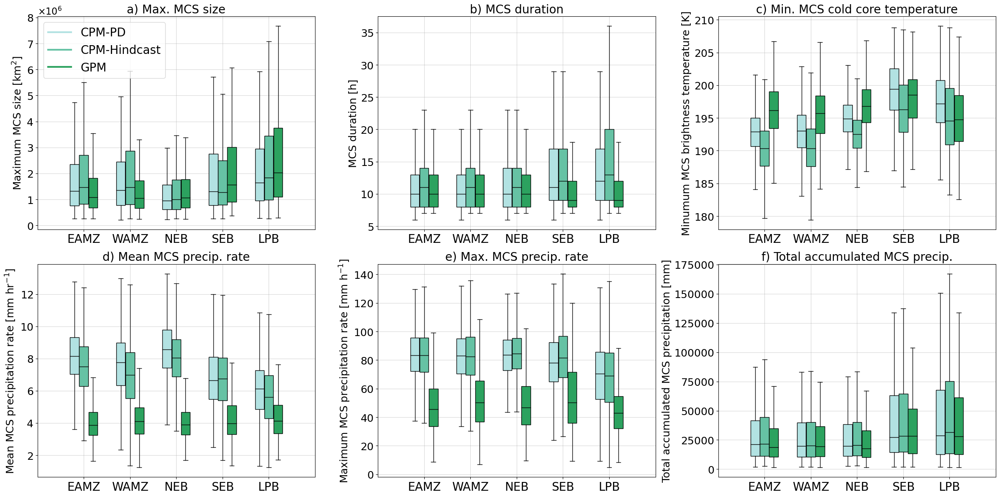

In [4]:
## max MCS size for CPM-PD and CPM-Hindcast in each region
import matplotlib
from matplotlib.ticker import StrMethodFormatter

medianprops = dict(linewidth=2, color='k')
boxprops = dict(linewidth=2, color='k')
whiskerprops = dict(linewidth=2, color='k')
capprops = dict(linewidth=2, color='k')

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color='k', linewidth=1, facecolor=color)
    plt.setp(bp['whiskers'], color='k', linewidth=1)
    plt.setp(bp['caps'], color='k', linewidth=1)
    plt.setp(bp['medians'], color='k',linewidth=1)


ticks = ['EAMZ', 'WAMZ', 'NEB', 'SEB', 'LPB']
 
fig = plt.figure(figsize =(24, 12))

### MAX SIZE ###
ax1 = fig.add_subplot(231)

bpl = ax1.boxplot(data_max_size_pd, positions=np.array(range(len(data_max_size_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax1.boxplot(data_max_size_cpm, positions=np.array(range(len(data_max_size_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax1.boxplot(data_max_size_obs, positions=np.array(range(len(data_max_size_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

# draw temporary red and blue lines and use them to create a legend
plt.plot([], c='#b2e2e2', label='CPM-PD', linewidth=3)
plt.plot([], c='#66c2a4', label='CPM-Hindcast', linewidth=3)
plt.plot([], c='#2ca25f', label='GPM', linewidth=3)
plt.legend(fontsize=20)

ax1.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax1.set_xlim(-2, len(ticks)*2)
ax1.set_xticklabels(ticks, fontsize=20)
ax1.set_yticklabels(ax1.get_yticks(), fontsize=18)
ax1.set_ylabel('Maximum MCS size [km$^{2}$]', fontsize=18)
ax1.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax1.yaxis.get_offset_text().set_fontsize(16)
ax1.set_title('a) Max. MCS size', fontsize=20)


### LIFETIME ###
ax2 = fig.add_subplot(232)

bpl = ax2.boxplot(data_duration_pd, positions=np.array(range(len(data_duration_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax2.boxplot(data_duration_cpm, positions=np.array(range(len(data_duration_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax2.boxplot(data_duration_obs, positions=np.array(range(len(data_duration_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

ax2.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax2.set_xlim(-2, len(ticks)*2)
ax2.set_xticklabels(ticks, fontsize=20)
ax2.set_yticklabels(ax2.get_yticks(), fontsize=18)
ax2.set_ylabel('MCS duration [h]', fontsize=18)
ax2.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax2.yaxis.get_offset_text().set_fontsize(16)
ax2.set_title('b) MCS duration', fontsize=20)


### MIN TB ###
ax3 = fig.add_subplot(233)

bpl = ax3.boxplot(data_min_tb_pd, positions=np.array(range(len(data_min_tb_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax3.boxplot(data_min_tb_cpm, positions=np.array(range(len(data_min_tb_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax3.boxplot(data_min_tb_obs, positions=np.array(range(len(data_min_tb_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

ax3.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax3.set_xlim(-2, len(ticks)*2)
ax3.set_xticklabels(ticks, fontsize=20)
ax3.set_yticklabels(ax3.get_yticks(), fontsize=18)
ax3.set_ylabel('Minumum MCS brightness temperature [K]', fontsize=18)
ax3.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax3.yaxis.get_offset_text().set_fontsize(16)
ax3.set_title('c) Min. MCS cold core temperature', fontsize=20)


### MEAN PRECIP RATE ###
ax4 = fig.add_subplot(234)

bpl = ax4.boxplot(data_mean_preciprate_pd, positions=np.array(range(len(data_mean_preciprate_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax4.boxplot(data_mean_preciprate_cpm, positions=np.array(range(len(data_mean_preciprate_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax4.boxplot(data_mean_preciprate_obs, positions=np.array(range(len(data_mean_preciprate_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

ax4.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax4.set_xlim(-2, len(ticks)*2)
ax4.set_xticklabels(ticks, fontsize=20)
ax4.set_yticklabels(ax4.get_yticks(), fontsize=18)
ax4.set_ylabel('Mean MCS precipitation rate [mm hr$^{-1}$]', fontsize=18)
ax4.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax4.yaxis.get_offset_text().set_fontsize(16)
ax4.set_title('d) Mean MCS precip. rate', fontsize=20)


### MAX PRECIP RATE ###
ax5 = fig.add_subplot(235)

bpl = ax5.boxplot(data_max_preciprate_pd, positions=np.array(range(len(data_max_preciprate_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax5.boxplot(data_max_preciprate_cpm, positions=np.array(range(len(data_max_preciprate_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax5.boxplot(data_max_preciprate_obs, positions=np.array(range(len(data_max_preciprate_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

ax5.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax5.set_xlim(-2, len(ticks)*2)
ax5.set_xticklabels(ticks, fontsize=20)
ax5.set_yticklabels(ax5.get_yticks(), fontsize=18)
ax5.set_ylabel('Maximum MCS precipitation rate [mm h$^{-1}$]', fontsize=18)
ax5.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax5.yaxis.get_offset_text().set_fontsize(16)
ax5.set_title('e) Max. MCS precip. rate', fontsize=20)


### ACCUMULATED PRECIP ###
ax6 = fig.add_subplot(236)

bpl = ax6.boxplot(data_accumulated_precip_pd, positions=np.array(range(len(data_accumulated_precip_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax6.boxplot(data_accumulated_precip_cpm, positions=np.array(range(len(data_accumulated_precip_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax6.boxplot(data_accumulated_precip_obs, positions=np.array(range(len(data_accumulated_precip_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

ax6.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax6.set_xlim(-2, len(ticks)*2)
ax6.set_xticklabels(ticks, fontsize=20)
ax6.set_yticklabels(ax6.get_yticks(), fontsize=18)
ax6.set_ylabel('Total accumulated MCS precipitation [mm]', fontsize=18)
ax6.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax6.yaxis.get_offset_text().set_fontsize(16)
ax6.set_title('f) Total accumulated MCS precip.', fontsize=20)

plt.tight_layout()


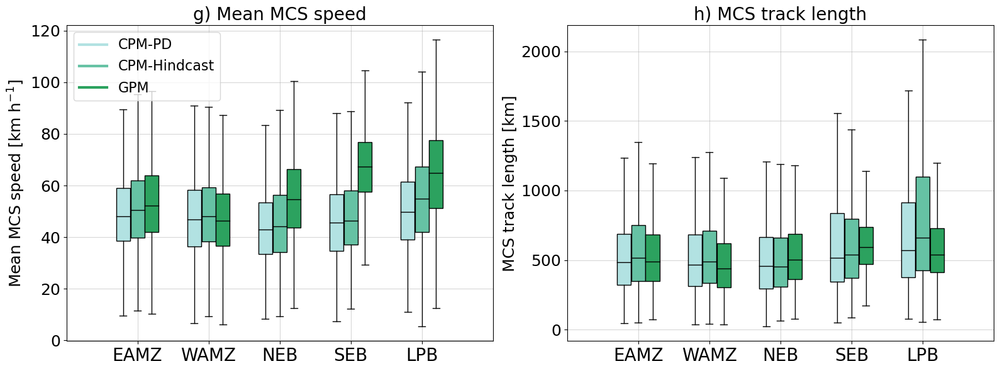

In [5]:
medianprops = dict(linewidth=2, color='k')
boxprops = dict(linewidth=2, color='k')
whiskerprops = dict(linewidth=2, color='k')
capprops = dict(linewidth=2, color='k')

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color='k', linewidth=1, facecolor=color)
    plt.setp(bp['whiskers'], color='k', linewidth=1)
    plt.setp(bp['caps'], color='k', linewidth=1)
    plt.setp(bp['medians'], color='k',linewidth=1)


ticks = ['EAMZ', 'WAMZ', 'NEB', 'SEB', 'LPB']
 
fig = plt.figure(figsize =(16, 6))

### MAX SIZE ###
ax1 = fig.add_subplot(121)

bpl = ax1.boxplot(data_mean_speed_pd, positions=np.array(range(len(data_mean_speed_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax1.boxplot(data_mean_speed_cpm, positions=np.array(range(len(data_mean_speed_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax1.boxplot(data_mean_speed_obs, positions=np.array(range(len(data_mean_speed_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

# draw temporary red and blue lines and use them to create a legend
plt.plot([], c='#b2e2e2', label='CPM-PD', linewidth=3)
plt.plot([], c='#66c2a4', label='CPM-Hindcast', linewidth=3)
plt.plot([], c='#2ca25f', label='GPM', linewidth=3)
plt.legend(loc='upper left', fontsize=16)

ax1.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax1.set_xlim(-2, len(ticks)*2)
ax1.set_xticklabels(ticks, fontsize=20)
ax1.set_yticklabels(ax1.get_yticks(), fontsize=18)
ax1.set_ylabel('Mean MCS speed [km h$^{-1}$]', fontsize=18)
ax1.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax1.yaxis.get_offset_text().set_fontsize(16)
ax1.set_title('g) Mean MCS speed', fontsize=20)


### LIFETIME ###
ax2 = fig.add_subplot(122)

bpl = ax2.boxplot(data_total_distance_pd, positions=np.array(range(len(data_total_distance_pd)))*2.0-0.4, sym='', widths=0.39, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True, medianprops=medianprops)
bpr = ax2.boxplot(data_total_distance_cpm, positions=np.array(range(len(data_total_distance_cpm)))*2.0+0, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)
bpo = ax2.boxplot(data_total_distance_obs, positions=np.array(range(len(data_total_distance_obs)))*2.0+0.4, sym='', widths=0.39, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, patch_artist=True)

set_box_color(bpl, '#b2e2e2') # colors are from http://colorbrewer2.org/
set_box_color(bpr, '#66c2a4')
set_box_color(bpo, '#2ca25f')

ax2.set_xticks(range(0, len(ticks) * 2, 2), ticks)
ax2.set_xlim(-2, len(ticks)*2)
ax2.set_xticklabels(ticks, fontsize=20)
ax2.set_yticklabels(ax2.get_yticks(), fontsize=18)
ax2.set_ylabel('MCS track length [km]', fontsize=18)
ax2.grid(which='major', alpha=0.5)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(plt.ScalarFormatter(useMathText=True))
ax2.yaxis.get_offset_text().set_fontsize(16)
ax2.set_title('h) MCS track length', fontsize=20)

plt.tight_layout()

In [377]:
## load dataframes for init and diss locations
all_years_cpm = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/merged/all_years_combined_CCPF/all_years_CCPF_cpm_hindcast_INIT_DISS_LOCATIONS.hdf', 'table')
all_years_obs = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/merged/all_years_combined_CCPF/all_years_CCPF_obs_INIT_DISS_LOCATIONS.hdf', 'table')
all_years_pd = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_PD_TRACKS/final_tracks/merged/all_years_combined_CCPF/all_years_CCPF_INIT_DISS_LOCATIONS.hdf', 'table')

In [378]:
all_years_cpm

,cell,initiation_lat,initiation_lon,dissipation_lat,dissipation_lon
0,20018,-1.804295,-70.603751,-4.475556,-72.528933
1,20026,-9.412115,-34.852409,-10.046687,-33.459050
2,20036,-21.031538,-58.802300,-20.676294,-61.562745
3,20043,-19.017418,-48.989982,-19.100932,-51.160756
4,20044,-21.787143,-59.571438,-19.206719,-59.782940
...,...,...,...,...,...
21055,200723230,-5.652812,-51.828706,-5.083835,-56.038124
21056,200723233,-15.220970,-67.347313,-10.462610,-68.260755
21057,200723235,-6.609466,-60.702839,-6.234066,-60.633530
21058,200723245,-7.828477,-42.875584,-7.101434,-45.628160


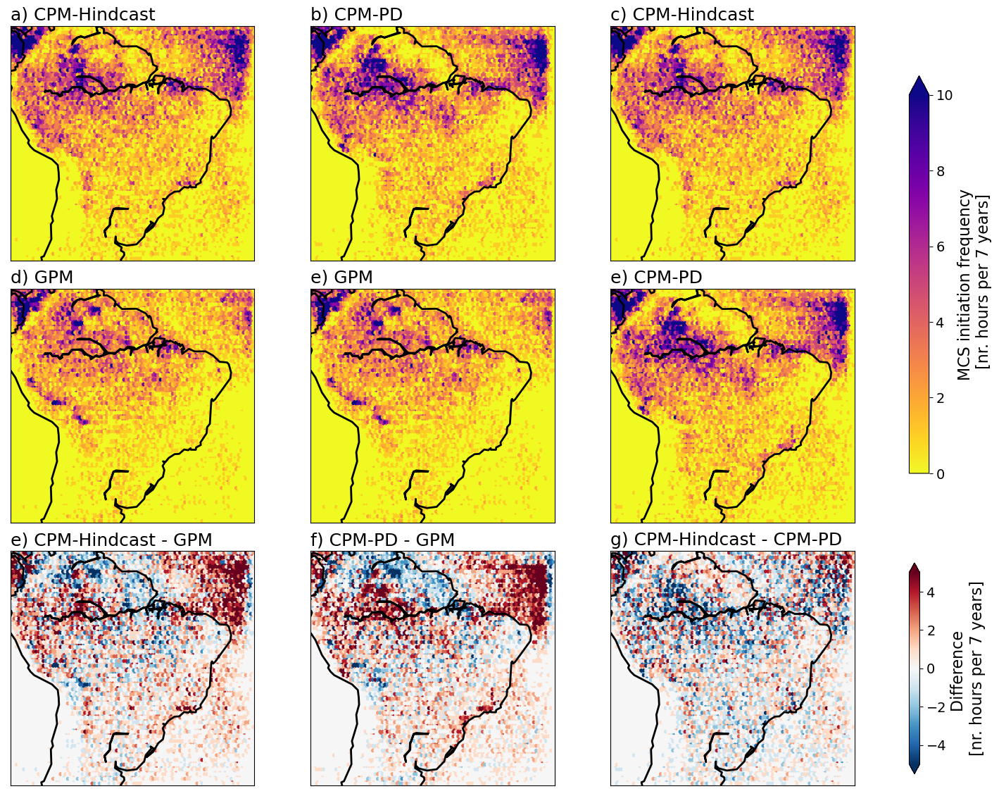

In [389]:
## density of MCS initiation

import mpl_toolkits
from mpl_toolkits.basemap import Basemap

x_f = all_years_cpm.initiation_lon
y_f = all_years_cpm.initiation_lat

x_pd = all_years_pd.initiation_lon
y_pd = all_years_pd.initiation_lat

x_o = all_years_obs.initiation_lon
y_o = all_years_obs.initiation_lat


fig = plt.figure(figsize=(20,14))

ax1=plt.subplot(3,3,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_f = m.hexbin(x_f, y_f, C=None,cmap='plasma_r',vmin=0,vmax=10, extent=(-80, -30, -40, 15))
ax1.set_title('a) CPM-Hindcast', loc='left',fontsize=18)


ax2=plt.subplot(3,3,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_pd = m.hexbin(x_pd, y_pd, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15))
ax2.set_title('b) CPM-PD', loc='left',fontsize=18)


ax3=plt.subplot(3,3,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_f = m.hexbin(x_f, y_f, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax3.set_title('c) CPM-Hindcast', loc='left',fontsize=18)

ax4=plt.subplot(3,3,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_o = m.hexbin(x_o, y_o, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax4.set_title('d) GPM', loc='left',fontsize=18)

ax5=plt.subplot(3,3,5)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_o = m.hexbin(x_o, y_o, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax5.set_title('e) GPM', loc='left',fontsize=18)

ax6=plt.subplot(3,3,6)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_pd = m.hexbin(x_pd, y_pd, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax6.set_title('e) CPM-PD', loc='left',fontsize=18)

ax7=plt.subplot(3,3,7)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_diff=m.hexbin(x_f, y_f, C=None,cmap='RdBu_r', vmin=-5,vmax=5, extent=(-80, -30, -40, 15))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array()) ## 61320 hours between 01/01/2001 and 31/12/2007. *100 to go from ratio to %
ax7.set_title('e) CPM-Hindcast - GPM', loc='left',fontsize=18)
# cbar = plt.colorbar(hx_diff, ax=ax7, shrink=0.8, extend='both')
# cbar.set_label(label='CPM-Hindcast - GPM', fontsize=16)
# cbar.ax.tick_params(labelsize=12)

ax8=plt.subplot(3,3,8)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_diff_2=m.hexbin(x_f, y_f, C=None,cmap='RdBu_r', vmin=-5,vmax=5, extent=(-80, -30, -40, 15))
hx_diff_2.set_array(hx_pd.get_array()-hx_o.get_array()) ## 61320 hours between 01/01/2001 and 31/12/2007. *100 to go from ratio to %
ax8.set_title('f) CPM-PD - GPM', loc='left',fontsize=18)
# cbar = plt.colorbar(hx_diff_2, ax=ax8, shrink=0.8, extend='both')
# cbar.set_label(label='CPM-PD - GPM', fontsize=16)
# cbar.ax.tick_params(labelsize=12)

ax9=plt.subplot(3,3,9)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_diff_3=m.hexbin(x_f, y_f, C=None,cmap='RdBu_r', vmin=-5,vmax=5, extent=(-80, -30, -40, 15))
hx_diff_3.set_array(hx_f.get_array()-hx_pd.get_array()) ## 61320 hours between 01/01/2001 and 31/12/2007. *100 to go from ratio to %
ax9.set_title('g) CPM-Hindcast - CPM-PD', loc='left',fontsize=18)
# cbar = plt.colorbar(hx_diff_3, ax=ax9, shrink=0.8, extend='both')
# cbar.set_label(label='CPM-Hindcast - CPM-PD', fontsize=16)
# cbar.ax.tick_params(labelsize=12)


fig.subplots_adjust(right=0.9, wspace=0.1, hspace=0.12)
cbar = fig.colorbar(hx_pd, ax=[ax1, ax2, ax3, ax4, ax5, ax6], shrink=0.8, extend='max')
cbar_2 = fig.colorbar(hx_diff_2, ax=[ax7, ax8, ax9], shrink=0.9, extend='both')

cbar.set_label(label='MCS initiation frequency\n [nr. hours per 7 years]', fontsize=16)
cbar.ax.tick_params(labelsize=14)

cbar_2.set_label(label='Difference \n[nr. hours per 7 years]', fontsize=16)
cbar_2.ax.tick_params(labelsize=14)

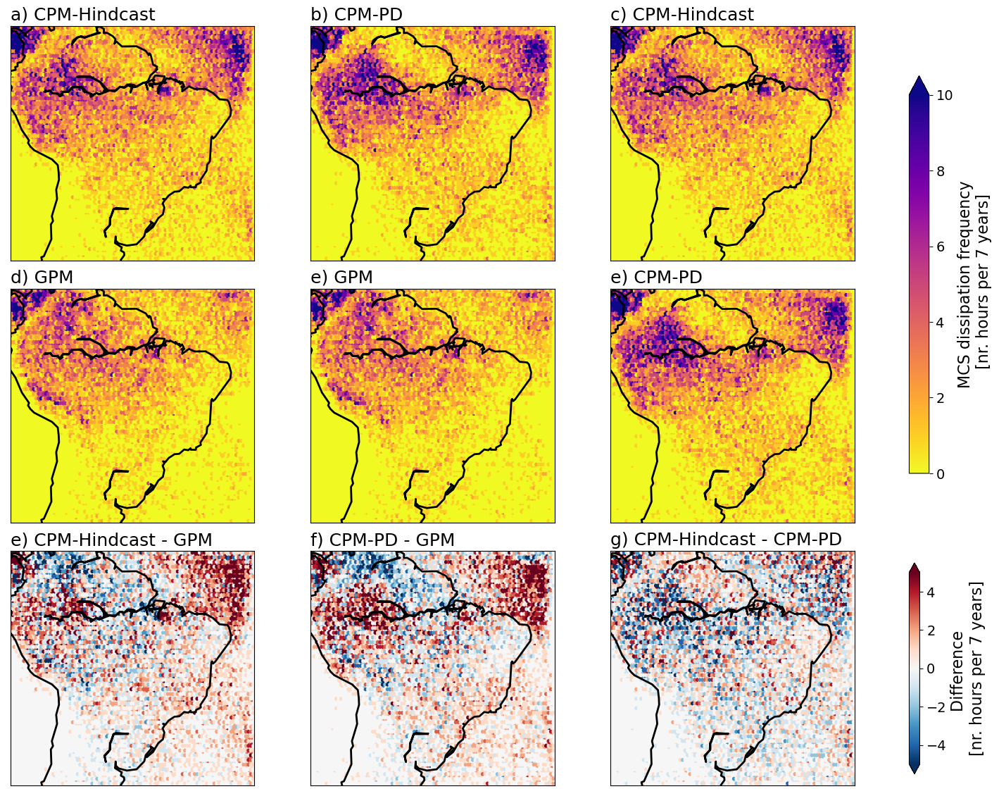

In [390]:
## density of MCS initiation

import mpl_toolkits
from mpl_toolkits.basemap import Basemap

x_f = all_years_cpm.dissipation_lon
y_f = all_years_cpm.dissipation_lat

x_pd = all_years_pd.dissipation_lon
y_pd = all_years_pd.dissipation_lat

x_o = all_years_obs.dissipation_lon
y_o = all_years_obs.dissipation_lat


fig = plt.figure(figsize=(20,14))

ax1=plt.subplot(3,3,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_f = m.hexbin(x_f, y_f, C=None,cmap='plasma_r',vmin=0,vmax=10, extent=(-80, -30, -40, 15))
ax1.set_title('a) CPM-Hindcast', loc='left',fontsize=18)


ax2=plt.subplot(3,3,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_pd = m.hexbin(x_pd, y_pd, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15))
ax2.set_title('b) CPM-PD', loc='left',fontsize=18)


ax3=plt.subplot(3,3,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_f = m.hexbin(x_f, y_f, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax3.set_title('c) CPM-Hindcast', loc='left',fontsize=18)

ax4=plt.subplot(3,3,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_o = m.hexbin(x_o, y_o, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax4.set_title('d) GPM', loc='left',fontsize=18)

ax5=plt.subplot(3,3,5)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_o = m.hexbin(x_o, y_o, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax5.set_title('e) GPM', loc='left',fontsize=18)

ax6=plt.subplot(3,3,6)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_pd = m.hexbin(x_pd, y_pd, C=None,cmap='plasma_r', vmin=0,vmax=10, extent=(-80, -30, -40, 15), edgecolors='face')
ax6.set_title('e) CPM-PD', loc='left',fontsize=18)

ax7=plt.subplot(3,3,7)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_diff=m.hexbin(x_f, y_f, C=None,cmap='RdBu_r', vmin=-5,vmax=5, extent=(-80, -30, -40, 15))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array()) ## 61320 hours between 01/01/2001 and 31/12/2007. *100 to go from ratio to %
ax7.set_title('e) CPM-Hindcast - GPM', loc='left',fontsize=18)
# cbar = plt.colorbar(hx_diff, ax=ax7, shrink=0.8, extend='both')
# cbar.set_label(label='CPM-Hindcast - GPM', fontsize=16)
# cbar.ax.tick_params(labelsize=12)

ax8=plt.subplot(3,3,8)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_diff_2=m.hexbin(x_f, y_f, C=None,cmap='RdBu_r', vmin=-5,vmax=5, extent=(-80, -30, -40, 15))
hx_diff_2.set_array(hx_pd.get_array()-hx_o.get_array()) ## 61320 hours between 01/01/2001 and 31/12/2007. *100 to go from ratio to %
ax8.set_title('f) CPM-PD - GPM', loc='left',fontsize=18)
# cbar = plt.colorbar(hx_diff_2, ax=ax8, shrink=0.8, extend='both')
# cbar.set_label(label='CPM-PD - GPM', fontsize=16)
# cbar.ax.tick_params(labelsize=12)

ax9=plt.subplot(3,3,9)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
hx_diff_3=m.hexbin(x_f, y_f, C=None,cmap='RdBu_r', vmin=-5,vmax=5, extent=(-80, -30, -40, 15))
hx_diff_3.set_array(hx_f.get_array()-hx_pd.get_array()) ## 61320 hours between 01/01/2001 and 31/12/2007. *100 to go from ratio to %
ax9.set_title('g) CPM-Hindcast - CPM-PD', loc='left',fontsize=18)
# cbar = plt.colorbar(hx_diff_3, ax=ax9, shrink=0.8, extend='both')
# cbar.set_label(label='CPM-Hindcast - CPM-PD', fontsize=16)
# cbar.ax.tick_params(labelsize=12)


fig.subplots_adjust(right=0.9, wspace=0.1, hspace=0.12)
cbar = fig.colorbar(hx_pd, ax=[ax1, ax2, ax3, ax4, ax5, ax6], shrink=0.8, extend='max')
cbar_2 = fig.colorbar(hx_diff_2, ax=[ax7, ax8, ax9], shrink=0.9, extend='both')

cbar.set_label(label='MCS dissipation frequency\n [nr. hours per 7 years]', fontsize=16)
cbar.ax.tick_params(labelsize=14)

cbar_2.set_label(label='Difference \n[nr. hours per 7 years]', fontsize=16)
cbar_2.ax.tick_params(labelsize=14)

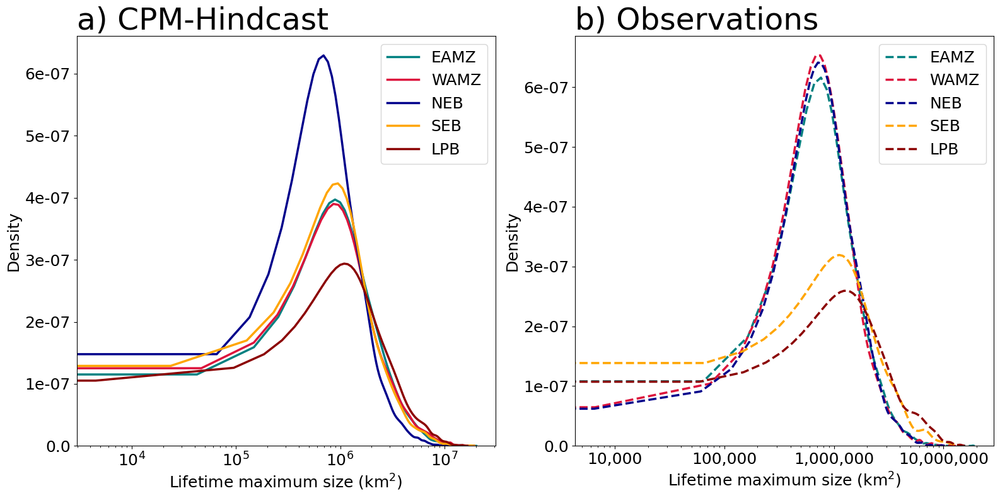

In [10]:
## max size of MCS in its lifetime ##
### rain flag ###
## max precip ##
# --------------
import matplotlib
matplotlib.rc_file_defaults()

f = 18

plt.figure(figsize=(16,8))

ax1 = plt.subplot(1, 2, 1) 
ax1.set_title('a) CPM-Hindcast ', loc='left', fontsize= 35)

sns.kdeplot(eamz_tracks_cpm.max_num * 10**2,multiple='layer',color='teal',label='EAMZ', linewidth=2.5, ax=ax1)
sns.kdeplot(wamz_tracks_cpm.max_num * 10**2,multiple='layer',color='crimson',label='WAMZ', linewidth=2.5, ax=ax1)
sns.kdeplot(neb_tracks_cpm.max_num * 10**2, color='darkblue',multiple='layer',label='NEB', linewidth=2.5, ax=ax1)
sns.kdeplot(seb_tracks_cpm.max_num * 10**2, color='orange',multiple='layer',label='SEB', linewidth=2.5, ax=ax1)
sns.kdeplot(lpb_tracks_cpm.max_num * 10**2, color='darkred',multiple='layer',label='LPB', linewidth=2.5, ax=ax1)
ax1.set_ylabel('Density', fontsize=f)
ax1.set_xlabel('Lifetime maximum size (km$^{2}$)', fontsize=f)
plt.legend(loc='best', fontsize=f)
#ax1.set_xlim(40000,600100)
#ax1.set_ylim(0,0.0025)
ax1.set_xticklabels(ax1.get_xticks(), fontsize=f)
ax1.set_yticklabels(ax1.get_yticks(), fontsize=f)
#plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.4f}')) # No decimal places
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}')) # No decimal places

ax1.set_xscale('log')



ax2 = plt.subplot(1, 2, 2) 
ax2.set_title('b) Observations ', loc='left', fontsize= 35)

sns.kdeplot(eamz_tracks_obs.max_num * 10**2,multiple='layer',color='teal',label='EAMZ', linewidth=2.5, ax=ax2, linestyle='dashed')
sns.kdeplot(wamz_tracks_obs.max_num * 10**2,multiple='layer',color='crimson',label='WAMZ', linewidth=2.5, ax=ax2, linestyle='dashed')
sns.kdeplot(neb_tracks_obs.max_num * 10**2, color='darkblue',multiple='layer',label='NEB', linewidth=2.5, ax=ax2, linestyle='dashed')
sns.kdeplot(seb_tracks_obs.max_num * 10**2, color='orange',multiple='layer',label='SEB', linewidth=2.5, ax=ax2, linestyle='dashed')
sns.kdeplot(lpb_tracks_obs.max_num * 10**2, color='darkred',multiple='layer',label='LPB', linewidth=2.5, ax=ax2, linestyle='dashed')
ax2.set_ylabel('Density', fontsize=f)
ax2.set_xlabel('Lifetime maximum size (km$^{2}$)', fontsize=f)
#ax2.set_ylim(0,0.0025)
#ax2.set_xlim(40000, 600100)
ax2.set_xticklabels(ax2.get_xticks(), fontsize=f)
ax2.set_yticklabels(ax2.get_yticks(), fontsize=f)
ax2.set_xscale('log')


plt.legend(loc='best', fontsize=f)

import matplotlib.ticker
from matplotlib.ticker import StrMethodFormatter
#plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.4f}')) # No decimal places
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}')) # No decimal places


plt.tight_layout()

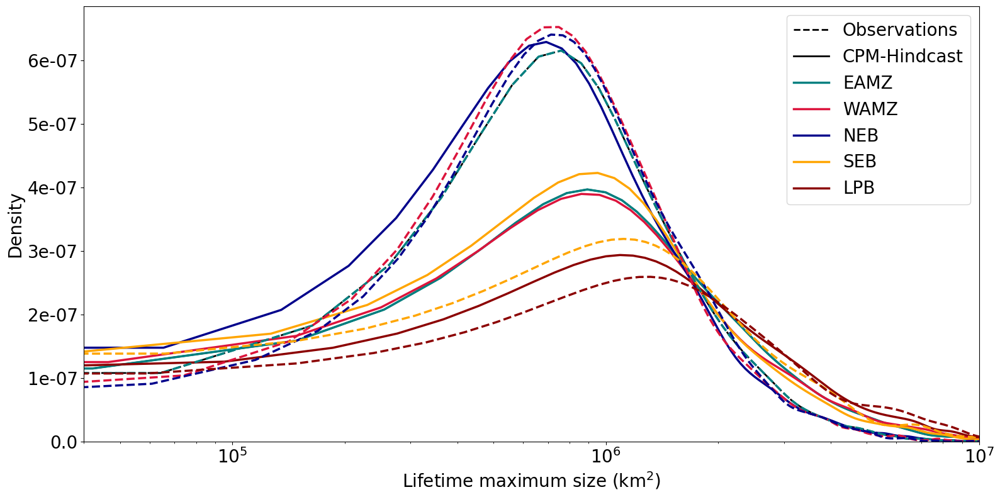

In [13]:
## no. rainy pixels ##
# --------------
import matplotlib
matplotlib.rc_file_defaults()

f = 20

plt.figure(figsize=(16,8))

ax1 = plt.subplot() 

sns.kdeplot(eamz_tracks_obs.max_num * 10**2,multiple='layer',color='k',label='Observations', linewidth=2, ax=ax1, linestyle='dashed')
sns.kdeplot(eamz_tracks_cpm.max_num * 10**2,multiple='layer',color='k',label='CPM-Hindcast', linewidth=2, ax=ax1)


sns.kdeplot(eamz_tracks_cpm.max_num * 10**2,multiple='layer',color='teal',label='EAMZ', linewidth=2.5, ax=ax1)
sns.kdeplot(wamz_tracks_cpm.max_num * 10**2,multiple='layer',color='crimson',label='WAMZ', linewidth=2.5, ax=ax1)
sns.kdeplot(neb_tracks_cpm.max_num * 10**2, color='darkblue',multiple='layer',label='NEB', linewidth=2.5, ax=ax1)
sns.kdeplot(seb_tracks_cpm.max_num * 10**2, color='orange',multiple='layer',label='SEB', linewidth=2.5, ax=ax1)
sns.kdeplot(lpb_tracks_cpm.max_num * 10**2, color='darkred',multiple='layer',label='LPB', linewidth=2.5, ax=ax1)
ax1.set_ylabel('Density', fontsize=f)
ax1.set_xlabel('Lifetime maximum size (km$^{2}$)', fontsize=f)
ax1.set_xlim(40000,10**7)
plt.legend(loc='best', fontsize=f)
#ax1.set_ylim(0,0.0025)
ax1.set_xticklabels(ax1.get_xticks(), fontsize=f)
ax1.set_yticklabels(ax1.get_yticks(), fontsize=f)

sns.kdeplot(eamz_tracks_obs.max_num * 10**2,multiple='layer',color='teal',linewidth=2.5, ax=ax1, linestyle='dashed')
sns.kdeplot(wamz_tracks_obs.max_num * 10**2,multiple='layer',color='crimson',linewidth=2.5, ax=ax1, linestyle='dashed')
sns.kdeplot(neb_tracks_obs.max_num * 10**2, color='darkblue',multiple='layer',linewidth=2.5, ax=ax1, linestyle='dashed')
sns.kdeplot(seb_tracks_obs.max_num * 10**2, color='orange',multiple='layer',linewidth=2.5, ax=ax1, linestyle='dashed')
sns.kdeplot(lpb_tracks_obs.max_num * 10**2, color='darkred',multiple='layer',linewidth=2.5, ax=ax1, linestyle='dashed')

ax1.set_xscale('log')


plt.legend(loc='best', fontsize=f)

import matplotlib.ticker
from matplotlib.ticker import StrMethodFormatter
#plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.3f}'))

plt.tight_layout()

In [14]:
eamz_tracks_cpm

,cell,mean_num,max_num,min_num,lifetime,accumulated_precip,mean_rain_flag,max_rain_flag,accumulated_convective_precip,accumulated_heavy_precip,accumulated_extreme_precip,mean_heavy_rain_flag,mean_extreme_rain_flag,max_precip,mean_precip_total,mean_precip,tb_min,tb_mean,mean_size_of_cold_core,mean_size_tb_200,mean_size_tb_190,mean_size_tb_180,max_size_of_cold_core,max_size_of_tb_200,max_size_of_tb_190,max_size_of_tb_180,max_updraft,max_downdraft,mean_updraft,mean_downdraft,mean_updraft_area,mean_downdraft_area,max_updraft_area,max_downdraft_area,max_precip_lat,max_precip_lon,min_tb_lat,min_tb_lon,max_w_up_lat,max_w_up_lon,max_colocated_pixels,mean_colocated_pixels
0,200116,18115,27282,2111,9,44879.522217,559,921,43360.743896,26471.004761,3403.988113,120,5,89.602249,2,7,188.930908,223.079474,520,168,6,0,1404,718,60,0,5.382786,-0.569214,0.147384,-0.048393,1192.666667,897.666667,1902,1474,-9.15,-56.450001,-9.55,-56.349998,-5.550000,-57.150002,644,255
1,200132,6927,8280,5137,6,24294.603516,402,526,23749.989258,15544.889282,2428.524597,98,5,86.938194,3,8,196.038040,223.249350,124,5,0,0,284,23,0,0,5.068741,-0.895936,0.354589,-0.097762,620.000000,426.500000,762,490,-6.85,-55.650002,-7.95,-53.750000,-8.750000,-53.849998,187,89
2,200159,7697,10031,2238,9,24152.000610,343,568,23201.624832,12418.852272,1300.350109,60,2,93.876900,1,5,0.000000,200.797397,223,44,0,0,580,184,0,0,6.094516,-0.759210,0.218762,-0.088244,755.666667,616.666667,874,689,-7.25,-52.750000,0.00,0.000000,-6.350000,-53.650002,323,129
3,200169,5167,8807,2240,10,13758.594442,186,316,12983.582067,7396.121704,700.390976,32,1,77.677307,1,6,191.512131,226.143815,62,8,0,0,190,57,0,0,4.622380,-0.506010,0.220663,-0.075553,556.666667,390.000000,842,532,-6.25,-60.450001,-6.75,-60.349998,-5.950000,-61.349998,80,33
4,200193,2923,3796,2112,7,10604.624953,149,201,10320.840897,6967.830811,2056.041275,32,4,91.039680,2,6,194.181076,222.258579,78,8,0,0,154,27,0,0,5.319501,-0.769812,0.287116,-0.082572,291.000000,241.000000,317,301,-6.05,-64.750000,-6.15,-64.750000,-6.850000,-65.250000,97,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3201,200722913,60606,70980,54656,7,104516.846680,1661,2445,100463.980469,61460.262939,7601.082336,349,15,114.601471,1,6,0.000000,190.439007,2697,844,1,0,4285,1545,6,0,7.292446,-1.213291,0.219071,-0.125573,5686.000000,5396.500000,5801,6050,-21.15,-58.250000,0.00,0.000000,-18.750000,-59.950001,1475,843
3202,200722978,10540,20368,5664,8,19805.194336,306,594,18725.591675,10968.979126,574.625008,56,1,76.115501,1,7,192.198303,221.575395,267,42,0,0,496,92,0,0,4.526362,-0.961620,0.148989,-0.065185,943.333333,847.666667,1829,1194,-10.95,-58.049999,-11.95,-58.250000,-12.250000,-58.650002,220,109
3203,200722985,6140,10158,3531,7,15049.555725,191,309,14629.642273,10604.932068,1342.501282,56,2,68.573212,1,9,194.956482,223.750788,106,2,0,0,224,17,0,0,6.309268,-1.356963,0.305803,-0.143481,281.500000,445.500000,375,497,-19.25,-62.250000,-16.35,-65.550003,-22.450001,-59.250000,79,35
3204,200723141,3323,4295,2057,11,14605.169800,135,183,14207.897018,9443.132263,1521.369461,32,2,89.897263,2,8,190.524216,218.839162,151,44,0,0,222,91,0,0,5.331144,-0.722602,0.275445,-0.075519,252.500000,271.750000,300,402,-7.45,-60.250000,-6.65,-58.950001,-6.850000,-59.349998,120,79


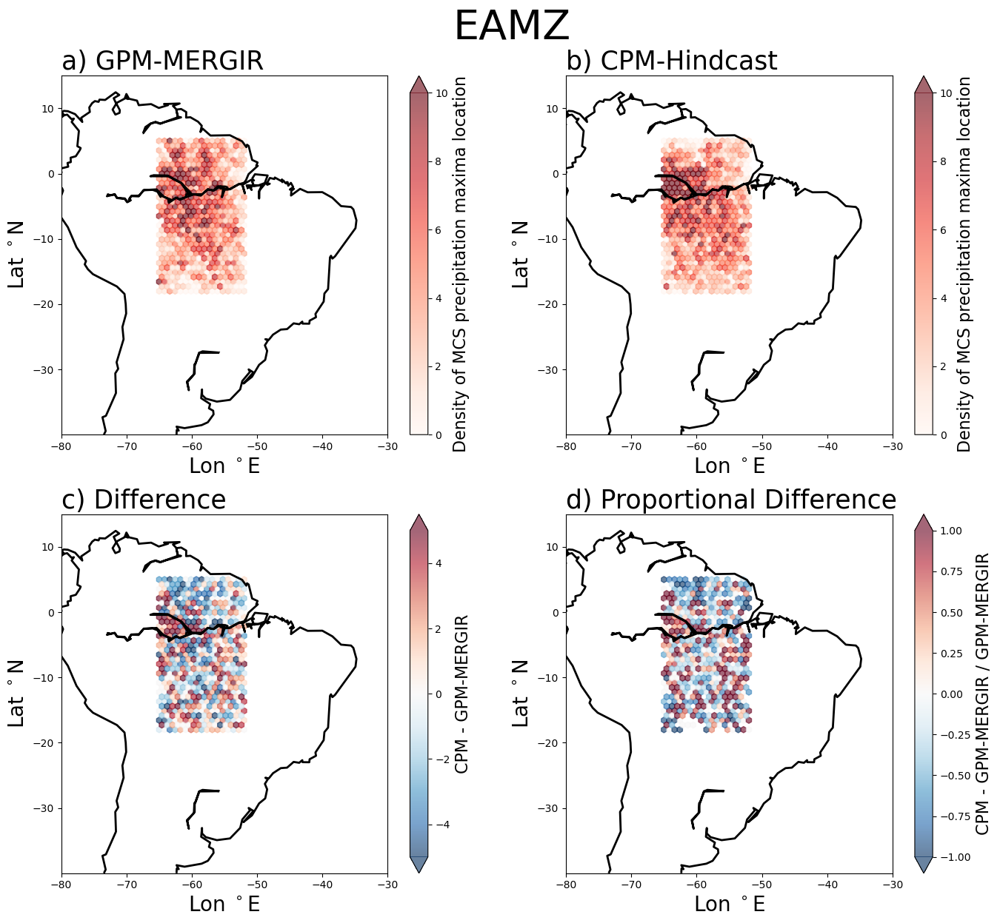

In [20]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f = eamz_tracks_cpm.max_precip_lon
y_f = eamz_tracks_cpm.max_precip_lat

x_o = eamz_tracks_obs.max_precip_lon
y_o = eamz_tracks_obs.max_precip_lat

### Eastern Amazon (65-52^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o = m.hexbin(x_o, y_o, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-65, -52, -18, 5))
cbar = plt.colorbar(hx_o, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f = m.hexbin(x_f, y_f, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-65, -52, -18, 5))
cbar = plt.colorbar(hx_f, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-5,vmax=5, extent=(-65, -52, -18, 5))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-65, -52, -18, 5))
hx_diff.set_array((hx_f.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'EAMZ', fontsize=40)

plt.tight_layout()

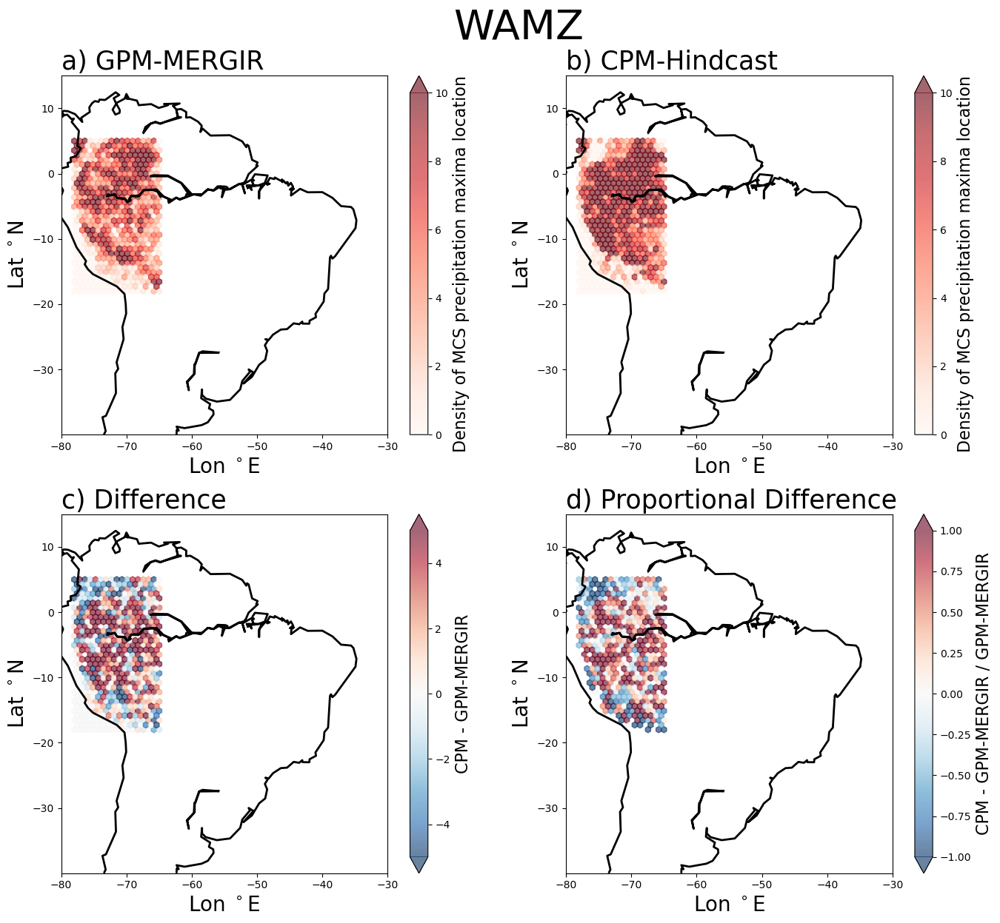

In [21]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f = wamz_tracks_cpm.max_precip_lon
y_f = wamz_tracks_cpm.max_precip_lat

x_o = wamz_tracks_obs.max_precip_lon
y_o = wamz_tracks_obs.max_precip_lat

### Western Amazon (78-65^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o = m.hexbin(x_o, y_o, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-78, -65, -18, 5))
cbar = plt.colorbar(hx_o, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f = m.hexbin(x_f, y_f, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-78, -65, -18, 5))
cbar = plt.colorbar(hx_f, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-5,vmax=5, extent=(-78, -65, -18, 5))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-78, -65, -18, 5))
hx_diff.set_array((hx_f.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'WAMZ', fontsize=40)

plt.tight_layout()

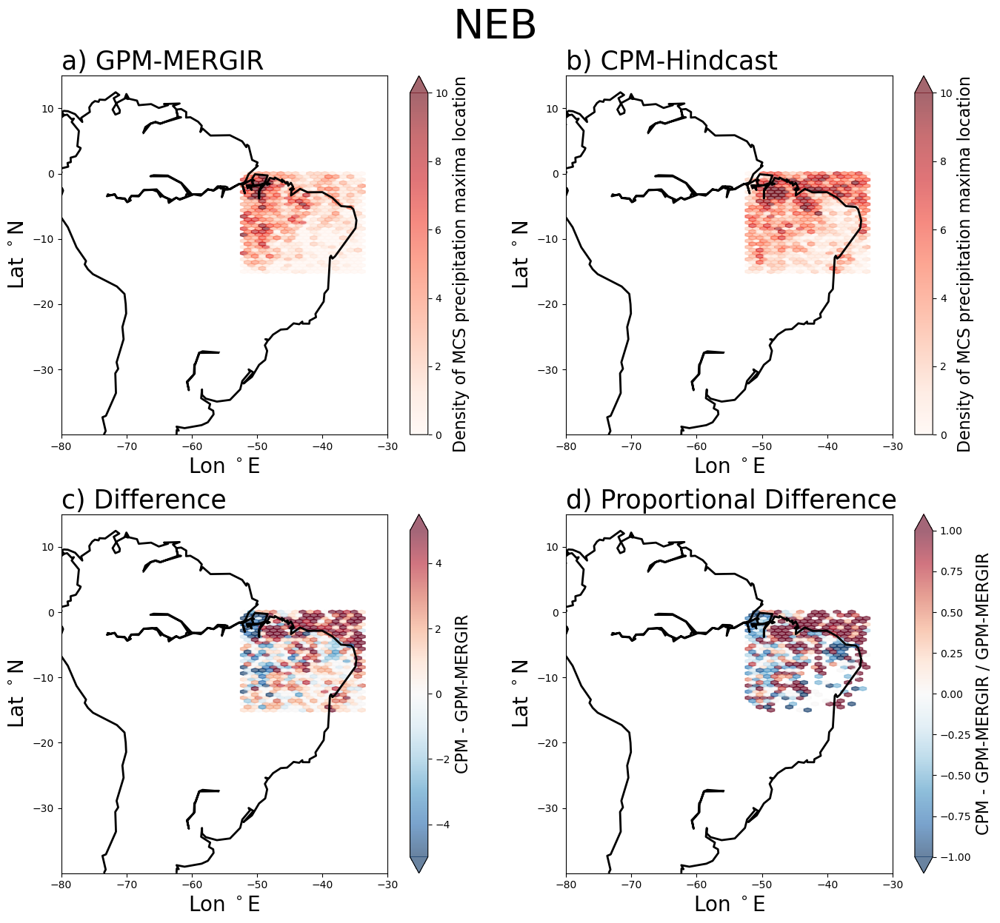

In [22]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f = neb_tracks_cpm.max_precip_lon
y_f = neb_tracks_cpm.max_precip_lat

x_o = neb_tracks_obs.max_precip_lon
y_o = neb_tracks_obs.max_precip_lat

### North East Brazil (52-34^W, 15-0^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o = m.hexbin(x_o, y_o, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-52, -34, -15, 0))
cbar = plt.colorbar(hx_o, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f = m.hexbin(x_f, y_f, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-52, -34, -15, 0))
cbar = plt.colorbar(hx_f, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-5,vmax=5, extent=(-52, -34, -15, 0))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-52, -34, -15, 0))
hx_diff.set_array((hx_f.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'NEB', fontsize=40)

plt.tight_layout()

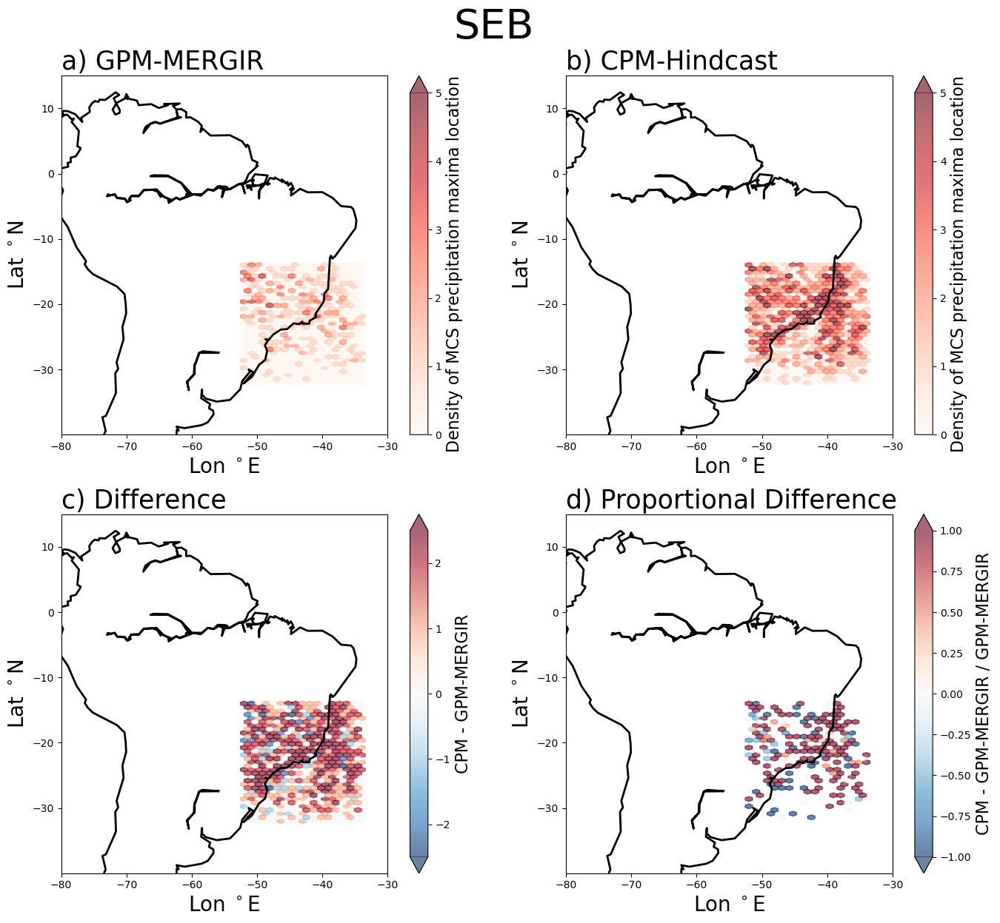

In [23]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f = seb_tracks_cpm.max_precip_lon
y_f = seb_tracks_cpm.max_precip_lat

x_o = seb_tracks_obs.max_precip_lon
y_o = seb_tracks_obs.max_precip_lat

### South East Brazil (52-34^w, 32-14^S) ###

fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o = m.hexbin(x_o, y_o, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=5, extent=(-52, -34, -32, -14))
cbar = plt.colorbar(hx_o, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f = m.hexbin(x_f, y_f, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=5, extent=(-52, -34, -32, -14))
cbar = plt.colorbar(hx_f, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-2.5,vmax=2.5, extent=(-52, -34, -32, -14))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-52, -34, -32, -14))
hx_diff.set_array((hx_f.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'SEB', fontsize=40)

plt.tight_layout()

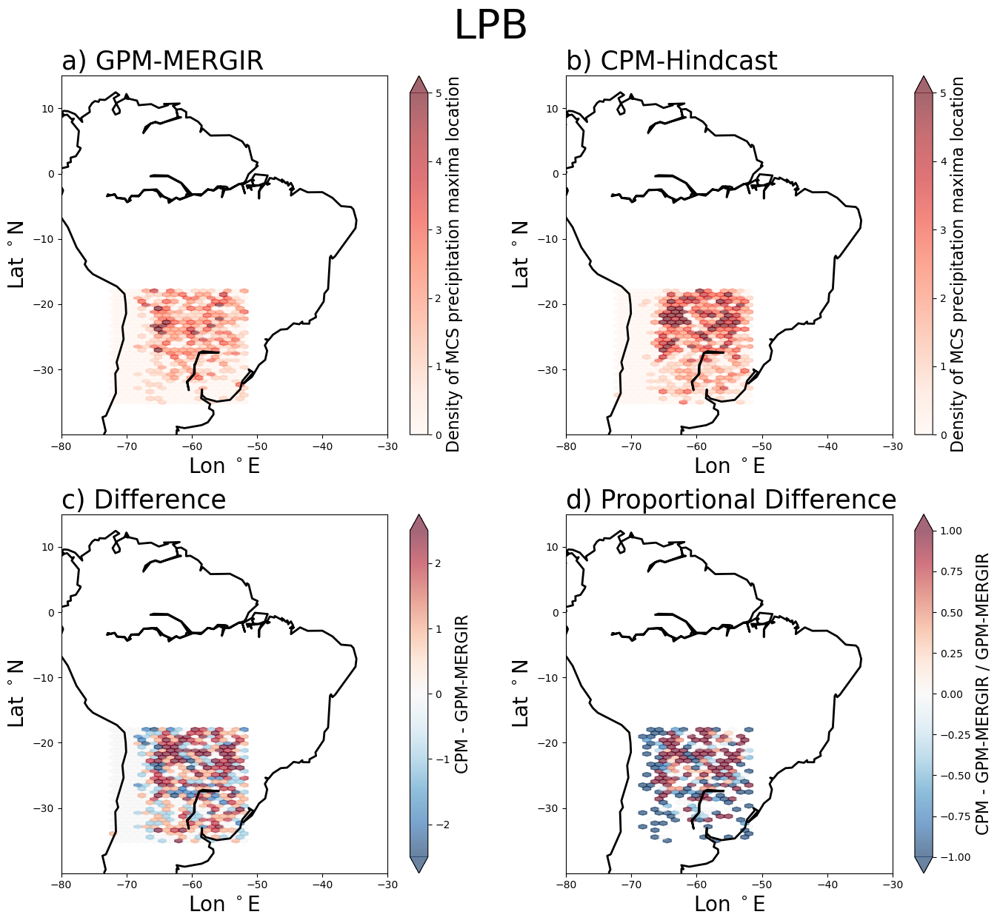

In [24]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f = lpb_tracks_cpm.max_precip_lon
y_f = lpb_tracks_cpm.max_precip_lat

x_o = lpb_tracks_obs.max_precip_lon
y_o = lpb_tracks_obs.max_precip_lat

### La Plata Basin (72-52^W, 35-18^S) ###

fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o = m.hexbin(x_o, y_o, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=5, extent=(-72, -52, -35, -18))
cbar = plt.colorbar(hx_o, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f = m.hexbin(x_f, y_f, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=5, extent=(-72, -52, -35, -18))
cbar = plt.colorbar(hx_f, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-2.5,vmax=2.5, extent=(-72, -52, -35, -18))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-72, -52, -35, -18))
hx_diff.set_array((hx_f.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'LPB', fontsize=40)

plt.tight_layout()

In [25]:
### location of max precip divided by the total number of hours with MCSs over that hexagon ###
## therefore need the original tracks dataframes that include multiple timesteps per mcs
eamz_tracks_cpm_original = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/eamz_tracks_cpm.hdf', 'table')
wamz_tracks_cpm_original = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/wamz_tracks_cpm.hdf', 'table')
neb_tracks_cpm_original =pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/neb_tracks_cpm.hdf', 'table')
seb_tracks_cpm_original =pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/seb_tracks_cpm.hdf', 'table')
lpb_tracks_cpm_original =pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/CPM_HINDCAST_TRACKS/final_tracks_CPM_REGRIDDED/regional_box_tracks/lpb_tracks_cpm.hdf', 'table')

eamz_tracks_obs_original = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/eamz_tracks_obs.hdf', 'table')
wamz_tracks_obs_original = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/wamz_tracks_obs.hdf', 'table')
neb_tracks_obs_original = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/neb_tracks_obs.hdf', 'table')
seb_tracks_obs_original = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/seb_tracks_obs.hdf', 'table')
lpb_tracks_obs_original = pd.read_hdf('/project/cssp_brazil/mcs_tracking_HG/OBS_TRACKS/final_tracks_obs/regional_box_tracks/lpb_tracks_obs.hdf', 'table')

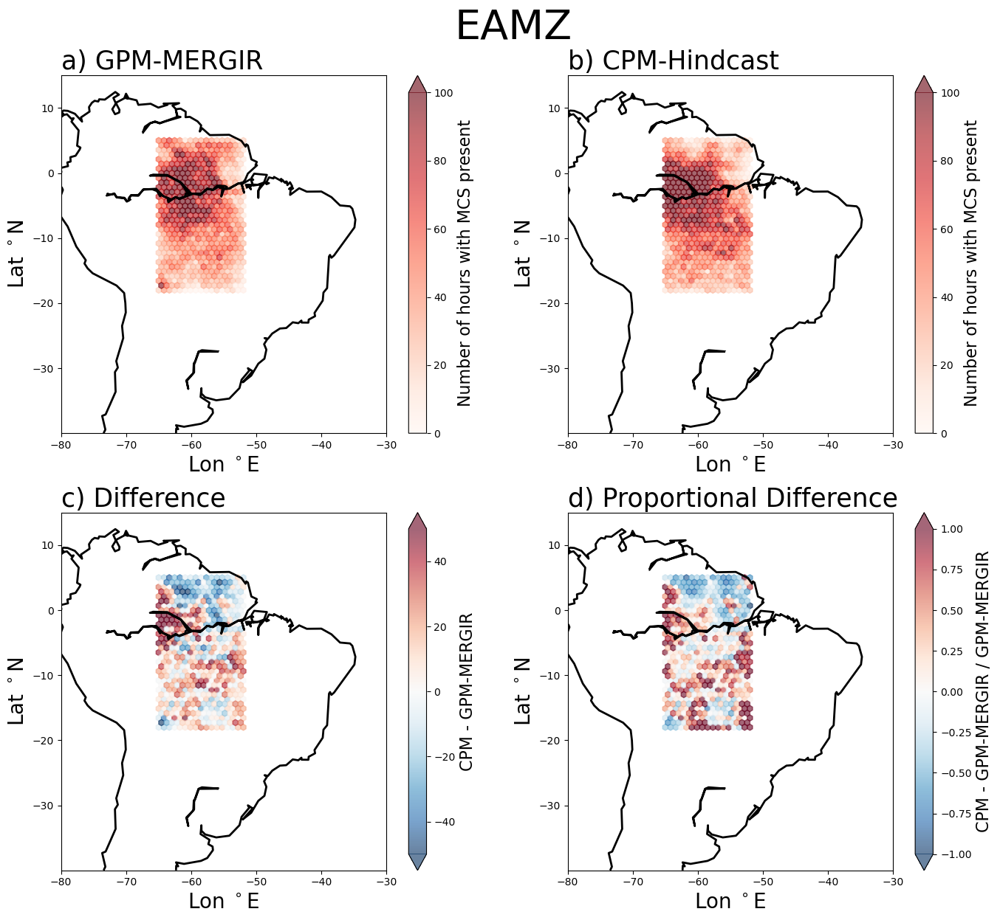

In [30]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f_hours = eamz_tracks_cpm_original.longitude
y_f_hours = eamz_tracks_cpm_original.latitude

x_o_hours = eamz_tracks_obs_original.longitude
y_o_hours = eamz_tracks_obs_original.latitude

### Eastern Amazon (65-52^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o_hours = m.hexbin(x_o_hours, y_o_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=100, extent=(-65, -52, -18, 5))
cbar = plt.colorbar(hx_o_hours, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Number of hours with MCS present', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f_hours = m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=100, extent=(-65, -52, -18, 5))
cbar = plt.colorbar(hx_f_hours, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Number of hours with MCS present', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-50,vmax=50, extent=(-65, -52, -18, 5))
hx_diff_hours.set_array(hx_f_hours.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-65, -52, -18, 5))
hx_diff_hours.set_array((hx_f_hours.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'EAMZ', fontsize=40)

plt.tight_layout()

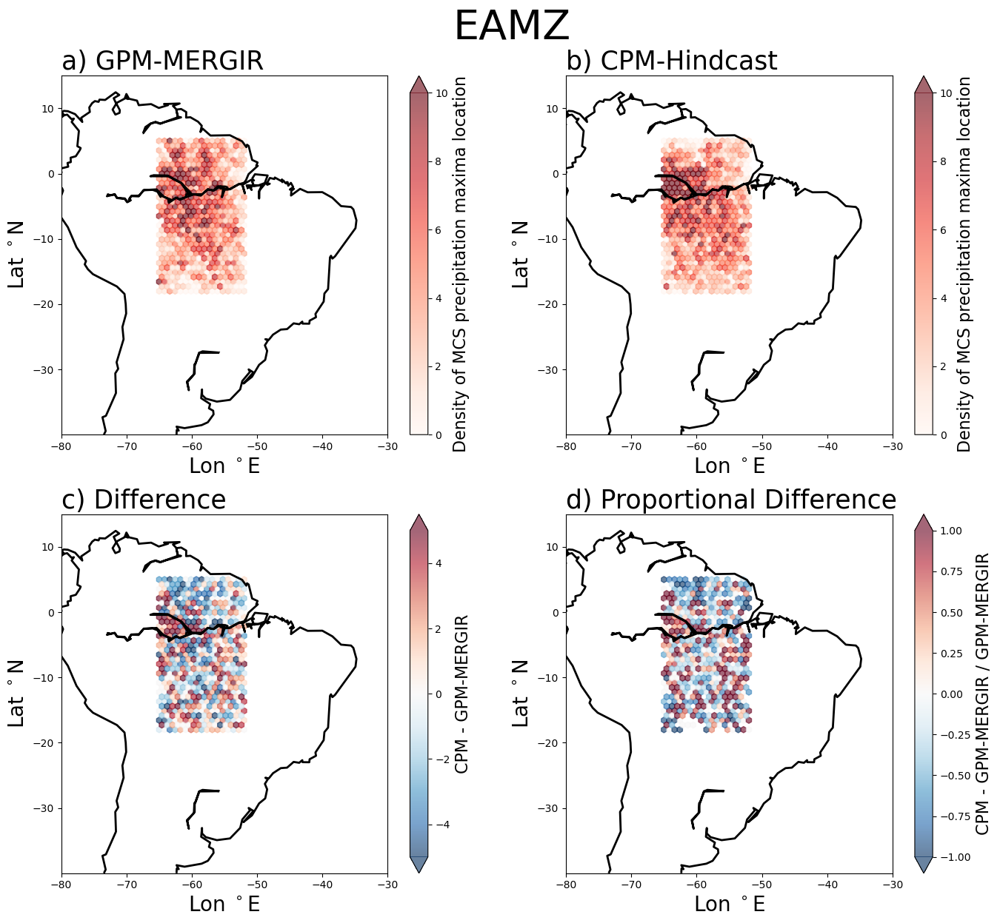

In [31]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f = eamz_tracks_cpm.max_precip_lon
y_f = eamz_tracks_cpm.max_precip_lat

x_o = eamz_tracks_obs.max_precip_lon
y_o = eamz_tracks_obs.max_precip_lat

### Eastern Amazon (65-52^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o = m.hexbin(x_o, y_o, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-65, -52, -18, 5))
cbar = plt.colorbar(hx_o, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f = m.hexbin(x_f, y_f, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-65, -52, -18, 5))
cbar = plt.colorbar(hx_f, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-5,vmax=5, extent=(-65, -52, -18, 5))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-65, -52, -18, 5))
hx_diff.set_array((hx_f.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'EAMZ', fontsize=40)

plt.tight_layout()

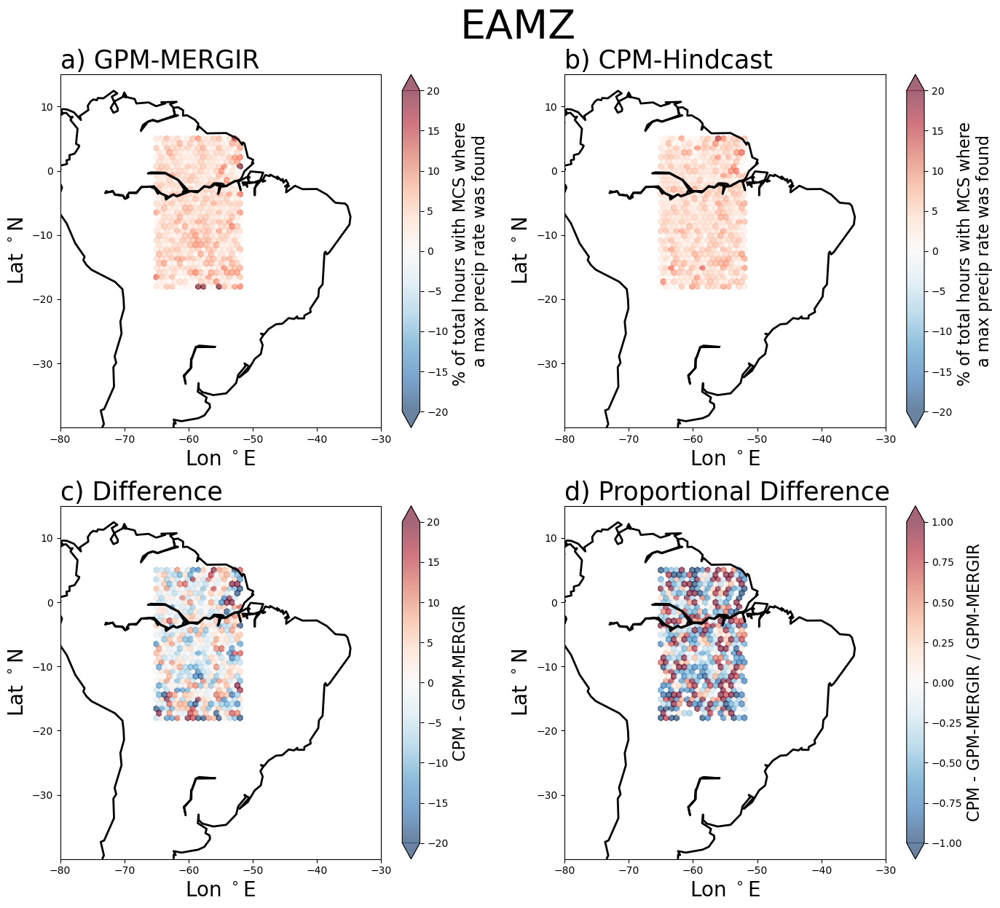

In [45]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f_hours = eamz_tracks_cpm_original.longitude
y_f_hours = eamz_tracks_cpm_original.latitude

x_o_hours = eamz_tracks_obs_original.longitude
y_o_hours = eamz_tracks_obs_original.latitude

### Eastern Amazon (65-52^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours_gpm=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=50, extent=(-65, -52, -18, 5))
hx_diff_hours_gpm.set_array((hx_o.get_array()/hx_o_hours.get_array())*100)
cbar = plt.colorbar(hx_diff_hours, ax=ax1, shrink=1, extend='both')
cbar.set_label(label='% of total hours with MCS where \na max precip rate was found', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours_cpm=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=50, extent=(-65, -52, -18, 5))
hx_diff_hours_cpm.set_array((hx_f.get_array()/hx_f_hours.get_array())*100)
cbar = plt.colorbar(hx_diff_hours, ax=ax2, shrink=1, extend='both')
cbar.set_label(label='% of total hours with MCS where \na max precip rate was found', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-20,vmax=20, extent=(-65, -52, -18, 5))
hx_diff_hours.set_array(hx_diff_hours_cpm.get_array()-hx_diff_hours_gpm.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-65, -52, -18, 5))
hx_diff_hours.set_array((hx_diff_hours_cpm.get_array()-hx_diff_hours_gpm.get_array())/hx_diff_hours_gpm.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'EAMZ', fontsize=40)

plt.tight_layout()

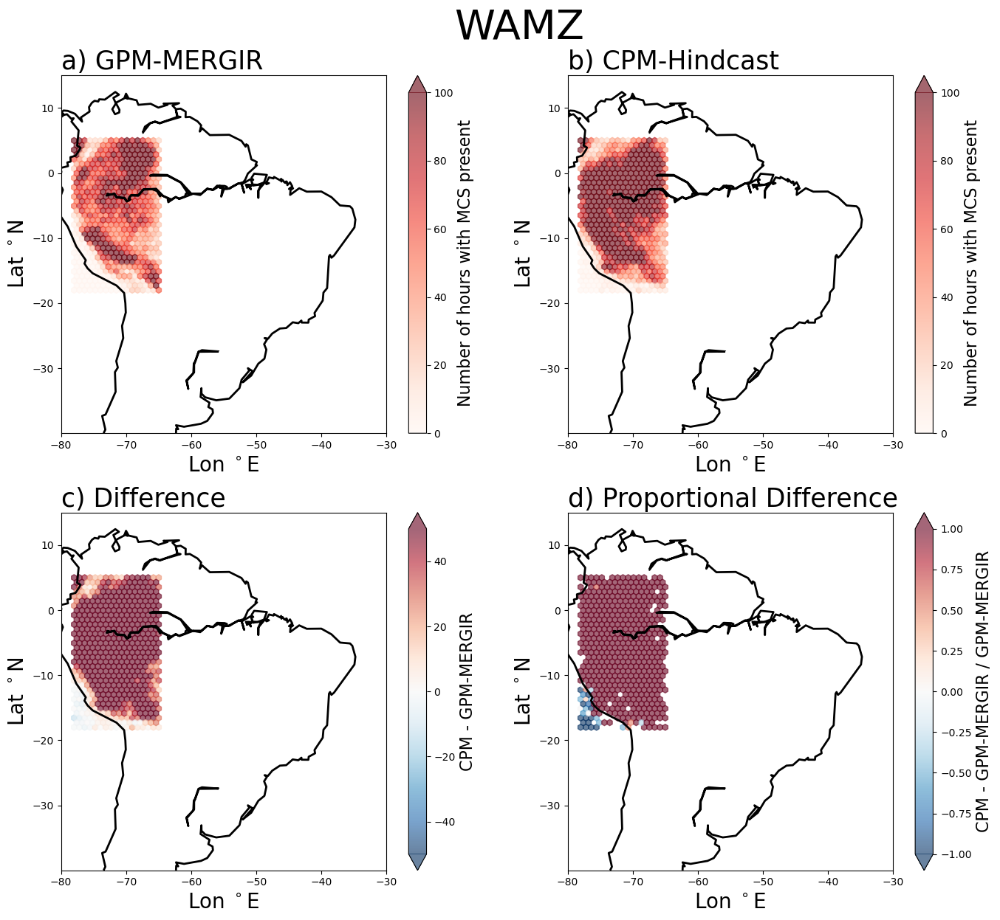

In [48]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f_hours = wamz_tracks_cpm_original.longitude
y_f_hours = wamz_tracks_cpm_original.latitude

x_o_hours = wamz_tracks_obs_original.longitude
y_o_hours = wamz_tracks_obs_original.latitude

### Eastern Amazon (65-52^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o_hours = m.hexbin(x_o_hours, y_o_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=100, extent=(-78, -65, -18, 5))
cbar = plt.colorbar(hx_o_hours, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Number of hours with MCS present', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f_hours = m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=100, extent=(-78, -65, -18, 5))
cbar = plt.colorbar(hx_f_hours, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Number of hours with MCS present', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-50,vmax=50, extent=(-78, -65, -18, 5))
hx_diff_hours.set_array(hx_f_hours.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-78, -65, -18, 5))
hx_diff_hours.set_array((hx_f_hours.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'WAMZ', fontsize=40)

plt.tight_layout()

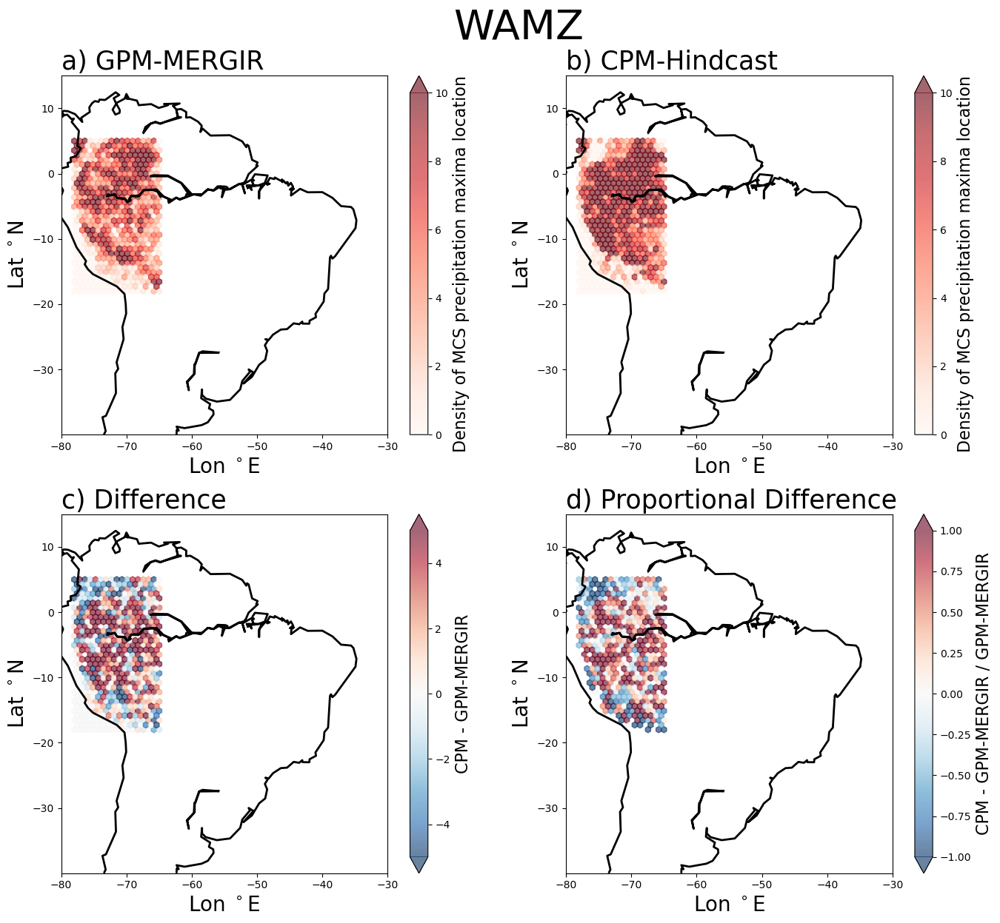

In [50]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f = wamz_tracks_cpm.max_precip_lon
y_f = wamz_tracks_cpm.max_precip_lat

x_o = wamz_tracks_obs.max_precip_lon
y_o = wamz_tracks_obs.max_precip_lat

### Eastern Amazon (65-52^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_o = m.hexbin(x_o, y_o, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-78, -65, -18, 5))
cbar = plt.colorbar(hx_o, ax=ax1, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()
hx_f = m.hexbin(x_f, y_f, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=10, extent=(-78, -65, -18, 5))
cbar = plt.colorbar(hx_f, ax=ax2, shrink=1, extend='max')
cbar.set_label(label='Density of MCS precipitation maxima location', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-5,vmax=5, extent=(-78, -65, -18, 5))
hx_diff.set_array(hx_f.get_array()-hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff=m.hexbin(x_f, y_f, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-78, -65, -18, 5))
hx_diff.set_array((hx_f.get_array()-hx_o.get_array())/hx_o.get_array())
cbar = plt.colorbar(hx_diff, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'WAMZ', fontsize=40)

plt.tight_layout()

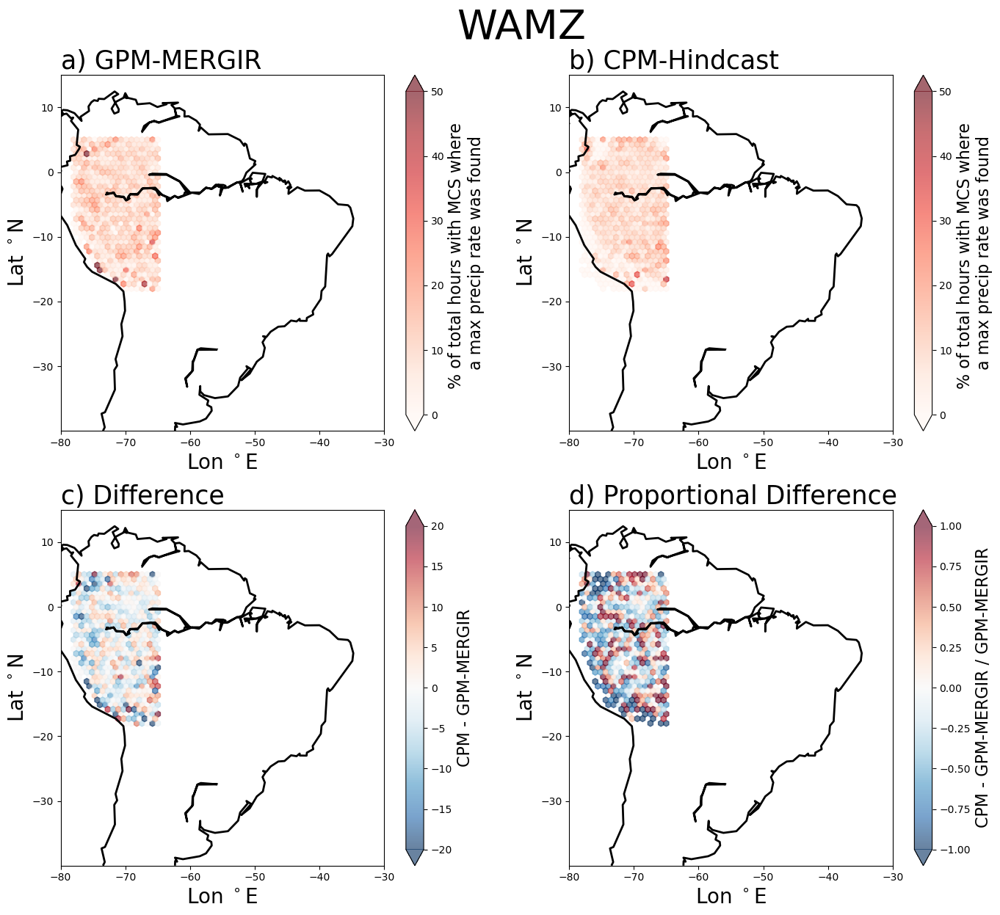

In [53]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon


x_f_hours = wamz_tracks_cpm_original.longitude
y_f_hours = wamz_tracks_cpm_original.latitude

x_o_hours = eamz_tracks_obs_original.longitude
y_o_hours = wamz_tracks_obs_original.latitude

### Eastern Amazon (65-52^W, 18-5^S) ###


fig = plt.figure(figsize=(14,12))

ax1=plt.subplot(2,2,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours_gpm=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=50, extent=(-78, -65, -18, 5))
hx_diff_hours_gpm.set_array((hx_o.get_array()/hx_o_hours.get_array())*100)
cbar = plt.colorbar(hx_diff_hours_gpm, ax=ax1, shrink=1, extend='both')
cbar.set_label(label='% of total hours with MCS where \na max precip rate was found', fontsize=16)
ax1.set_xlabel('Lon $^\circ$E', fontsize=20)
ax1.set_ylabel('Lat $^\circ$N', fontsize=20)
ax1.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax1.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax1.grid(False)
ax1.set_title('a) GPM-MERGIR', loc='left',fontsize=25)


ax2=plt.subplot(2,2,2)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours_cpm=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='Reds',alpha=0.6, vmin=0,vmax=50, extent=(-78, -65, -18, 5))
hx_diff_hours_cpm.set_array((hx_f.get_array()/hx_f_hours.get_array())*100)
cbar = plt.colorbar(hx_diff_hours_cpm, ax=ax2, shrink=1, extend='both')
cbar.set_label(label='% of total hours with MCS where \na max precip rate was found', fontsize=16)
ax2.set_xlabel('Lon $^\circ$E', fontsize=20)
ax2.set_ylabel('Lat $^\circ$N', fontsize=20)
ax2.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax2.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax2.grid(False)
ax2.set_title('b) CPM-Hindcast', loc='left',fontsize=25)


ax3=plt.subplot(2,2,3)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-20,vmax=20, extent=(-78, -65, -18, 5))
hx_diff_hours.set_array(hx_diff_hours_cpm.get_array()-hx_diff_hours_gpm.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax3, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax3.set_xlabel('Lon $^\circ$E', fontsize=20)
ax3.set_ylabel('Lat $^\circ$N', fontsize=20)
ax3.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax3.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax3.grid(False)
ax3.set_title('c) Difference', loc='left',fontsize=25)


ax4=plt.subplot(2,2,4)
m = Basemap(llcrnrlon=-80, llcrnrlat=-40,urcrnrlon=-30, urcrnrlat=15) # create Basemap object
m.drawcoastlines(linewidth=2) # draw coastlines
#m.drawcountries() # draw political boundaries
#m.shadedrelief()

# Create dummy hexbin using whatever data..:
hx_diff_hours=m.hexbin(x_f_hours, y_f_hours, gridsize=(16,16),cmap='RdBu_r',alpha=0.6, vmin=-1,vmax=1, extent=(-78, -65, -18, 5))
hx_diff_hours.set_array((hx_diff_hours_cpm.get_array()-hx_diff_hours_gpm.get_array())/hx_diff_hours_gpm.get_array())
cbar = plt.colorbar(hx_diff_hours, ax=ax4, shrink=1, extend='both')
cbar.set_label(label='CPM - GPM-MERGIR / GPM-MERGIR', fontsize=16)
#cbar.ax.tick_params(labelsize=12)
ax4.set_xlabel('Lon $^\circ$E', fontsize=20)
ax4.set_ylabel('Lat $^\circ$N', fontsize=20)
ax4.set_xticks([-80,-70,-60,-50,-40,-30],fontsize=20)
ax4.set_yticks([-30,-20,-10,0,10],fontsize=20)
ax4.grid(False)
ax4.set_title('d) Proportional Difference', loc='left',fontsize=25)

fig.text(0.46,1,'WAMZ', fontsize=40)

plt.tight_layout()